In [1]:
%reload_kedro --env intel

[05/13/24 20:28:39] INFO     Resolved project path as:                                              ]8;id=702703;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=496659;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#146\146]8;;\
                             /home/jamontanac/Documents/AdversarialExamples/adversarialexamples.                   
                             To set a different path, run '%reload_kedro <project_root>'                           

                    INFO     Kedro project AdversarialExamples                                      ]8;id=769823;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=3556;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#115\115]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=461634;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=443043;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#116\116]8;;\
                             'pipelines'                                                                           

                    INFO     Registered line magic 'run_viz'                                        ]8;id=443750;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=630059;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#122\122]8;;\

[05/15/24 22:07:55] INFO     Loading data from params:Data_information.input_shape              ]8;id=331739;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=289232;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (MemoryDataset)...                                                                    

                    INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=164527;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=477097;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Resnet model with DeepFool attack


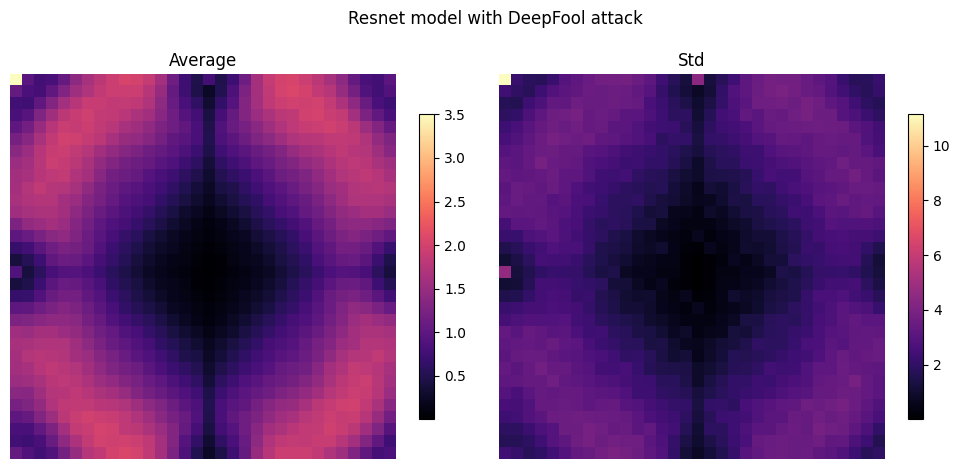

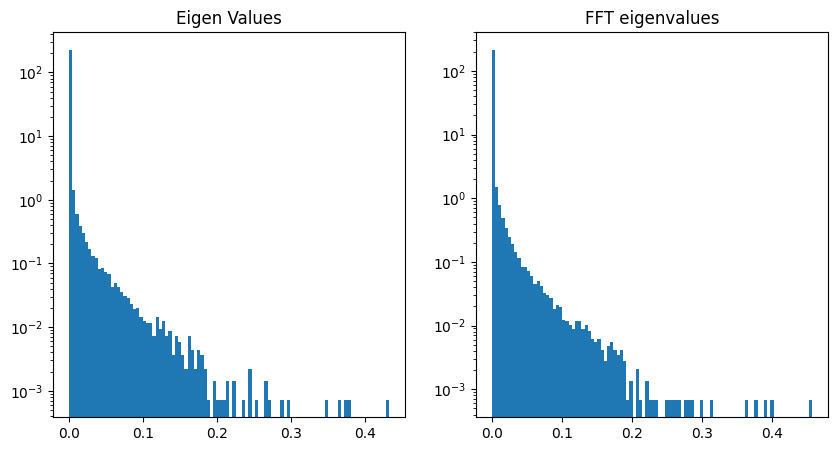

In [2]:
import torch
import itertools as it
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
#implement a 2d FFT for an image using pytorch
def randomFFT(image,log=True):
    """
    Apply 2D FFT to a given image.
    img: a tensor of shape (C, H, W)
    """
    # Convert the image to grayscale
    gray_image = torch.mean(image, dim=0, keepdim=True)
    
    # Apply 2D FFT to the grayscale image
    fft = torch.fft.fft2(gray_image, norm="ortho")
    fft = torch.fft.fftshift(fft)
    fft = torch.norm(fft,dim=0) 
    if log:
        fft = torch.log(fft+1e-9)
    
    return fft

def plot_FFT(avg_diff,std_diff,size=(10,5),cmap = 'magma', title = ''):
    fig, ax = plt.subplots(1, 2, figsize=size)
    # Plot the average difference
    cbar1 = ax[0].imshow(20*avg_diff, cmap=cmap, interpolation='nearest')
    fig.colorbar(cbar1, ax=ax[0],shrink=0.7)
    ax[0].axis('off')
    ax[0].set_title(f"Average")

    # Plot the std
    cbar2 = ax[1].imshow(20*std_diff, cmap=cmap, interpolation='nearest')
    # cbar2 = ax[1].imshow(instance, cmap=cmap, interpolation='nearest')
    fig.colorbar(cbar2, ax=ax[1],shrink=0.7)
    ax[1].axis('off')
    ax[1].set_title(f"Std")

    fig.suptitle(title)
    fig.tight_layout()
    plt.show()
def plot_FFT_3d(avg_diff,std_diff,title = '', display = False,dataset = 'CIFAR'):
    x = np.arange(avg_diff.shape[1])
    y = np.arange(avg_diff.shape[0])
    # Create a figure with two subplots
    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{'type': 'surface'}, {'type': 'surface'}]],
        subplot_titles=('Average', 'Std'),
        horizontal_spacing=0.1,
        vertical_spacing=0.1
    )

    # Add first surface plot
    fig.add_trace(
        go.Surface(z=avg_diff, x=x, y=y, colorscale='Cividis',colorbar=dict(title='Z', x=0.42)),
        row=1, col=1
    )

    # Add second surface plot
    fig.add_trace(
        go.Surface(z=std_diff, x=x, y=y, colorscale='Cividis',colorbar=dict(title='Z2', x=1.02)),
        row=1, col=2
    )
    
    # Update layout, labels, and titles
    fig.update_layout(
        title=title,
        width=1200,  # Increase figure width
        height=600,  # Increase figure height
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
        ),
        scene2=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z2',
        ),
        autosize=True
    )
    if display:
        fig.show()
    else:
        pio.write_image(fig, f"Results_images/{dataset}/{title}_FFT.png")


def compute_eigen_values(image,fft_image,normalize = False):
    """
    Compute the eigen values of the image and its attack.
    """
    # Convert the image to grayscale
    gray_image = torch.mean(image, dim=0, keepdim=True).squeeze()
    dimensions = gray_image.shape
    gray_image = gray_image@gray_image.T
    fft_image = fft_image@fft_image.T
    eigen_values_image  = torch.linalg.eigvals(gray_image)
    eigen_values_fft  = torch.linalg.eigvals(fft_image)
    if normalize:
        eigen_values_image = eigen_values_image/dimensions[0]
        eigen_values_fft = eigen_values_fft/dimensions[0]

    return eigen_values_image, eigen_values_fft
    # return eigen_values_image, eigen_values_adv
def plot_eigen_values(eigen_values, title = ''):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    # Plot eigen values of noise
    axs[0].hist(eigen_values['eigen_values_noise'], bins=100, density=True)
    axs[0].set_yscale('log')
    axs[0].set_title('Eigen Values')

    # Plot eigen values of the fft of the noise
    axs[1].hist(eigen_values['eigen_values_noise_fft'], bins=100, density=True)
    axs[1].set_yscale('log')
    axs[1].set_title('FFT eigenvalues')

    plt.show()

def generate_FFT_report(attacks,models,image_size,dataset = 'CIFAR',display = False):
    for model, attack in it.product(models, attacks):
        adver = catalog.load(f'{model}_model_Adversarial_{attack}@Dataset')
        #get adversarial and original images
        original_images = adver['original']
        adversarial_images = adver['examples']
        average_difference = torch.zeros(*image_size)
        std_difference = torch.zeros(*image_size)
        eigen_values_noise = torch.zeros(image_size[0]*len(original_images))
        eigen_values_noise_fft = torch.zeros(image_size[0]*len(original_images))
        #iterate through the images and compute the FFT
        print(f"Computing FFT for {model} model with {attack} attack")
        num_images = 0
        for i in range(len(original_images)): 
            original_image = original_images[i]
            adversarial_image = adversarial_images[i]
            noise_fft = randomFFT(torch.abs(adversarial_image-original_image),log=False)
            original_fft = randomFFT(original_image)
            adversarial_fft = randomFFT(adversarial_image)
            difference = torch.abs(adversarial_fft - original_fft)
            eig_image_noise, eig_fft_image_noise = compute_eigen_values(torch.abs(adversarial_image-original_image),noise_fft)
            eigen_values_noise[i*image_size[0]:(i+1)*image_size[0]] = torch.real(eig_image_noise)
            eigen_values_noise_fft[i*image_size[0]:(i+1)*image_size[0]] = torch.real(eig_fft_image_noise)
            average_difference += difference
            std_difference += difference**2
            num_images += 1


            
        average_difference /= num_images
        std_difference = torch.sqrt(std_difference/num_images - average_difference**2)
        eigen_info = {
            'eigen_values_noise': eigen_values_noise,
            'eigen_values_noise_fft': eigen_values_noise_fft,
        }
        plot_FFT(average_difference,std_difference,title=f"{model} model with {attack} attack")
        plot_FFT_3d(average_difference,std_difference,title=f"{model} model with {attack} attack",dataset = dataset,display = display)
        yield average_difference, eigen_info


attacks = ["DeepFool", "CarliniL2", "FSGM", "PGD"]
models = ['Resnet','Regnet_x','Regnet_y']
image_size = catalog.load("params:Data_information.input_shape")
for result in generate_FFT_report(attacks,models,image_size,dataset = 'intel',display=True):
    plot_eigen_values(result[1])
    break

In [3]:
%reload_kedro --env arch

[05/13/24 11:33:57] INFO     Resolved project path as:                                              ]8;id=640242;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=43121;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#146\146]8;;\
                             /home/jamontanac/Documents/AdversarialExamples/adversarialexamples.                   
                             To set a different path, run '%reload_kedro <project_root>'                           

[05/13/24 11:33:59] INFO     Kedro project AdversarialExamples                                      ]8;id=109538;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=417278;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#115\115]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=266491;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=48730;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#116\116]8;;\
                             'pipelines'                                                                           

                    INFO     Registered line magic 'run_viz'                                        ]8;id=957522;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=638845;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#122\122]8;;\

                    INFO     Loading data from params:Data_information.input_shape              ]8;id=18068;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=436378;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (MemoryDataset)...                                                                    

                    INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=312344;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=705890;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Resnet model with DeepFool attack


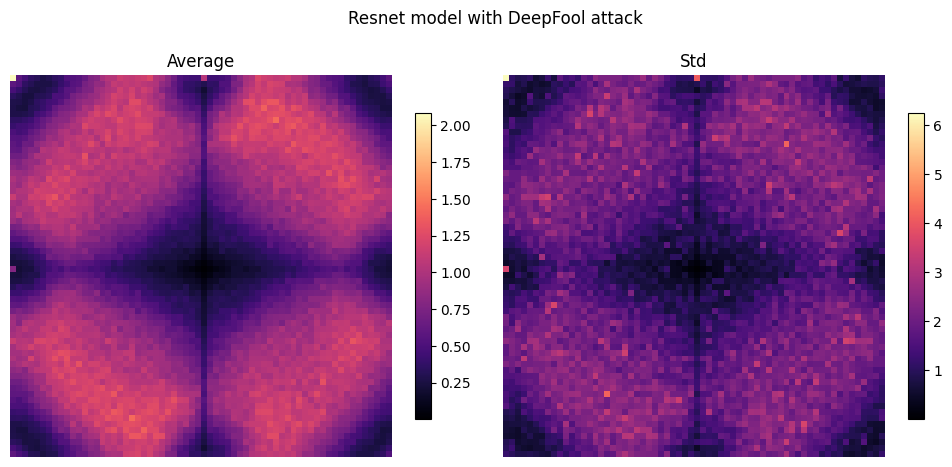

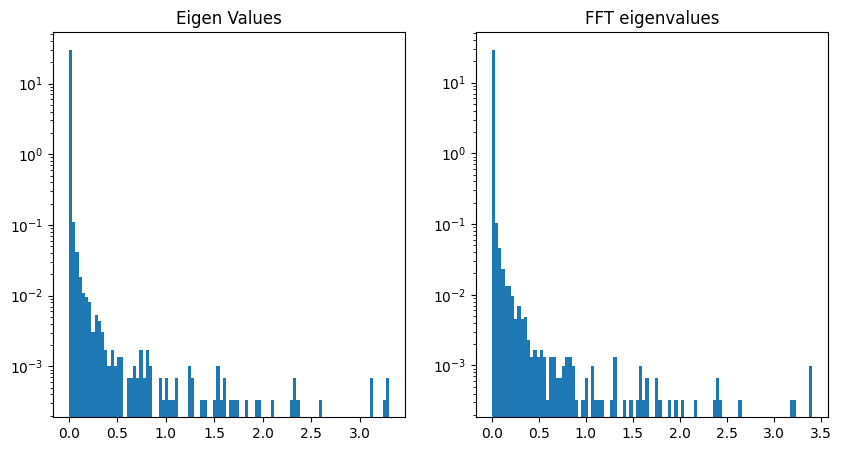

[05/13/24 11:34:05] INFO     Loading data from Resnet_model_Adversarial_CarliniL2@Dataset       ]8;id=920188;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=621755;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Resnet model with CarliniL2 attack


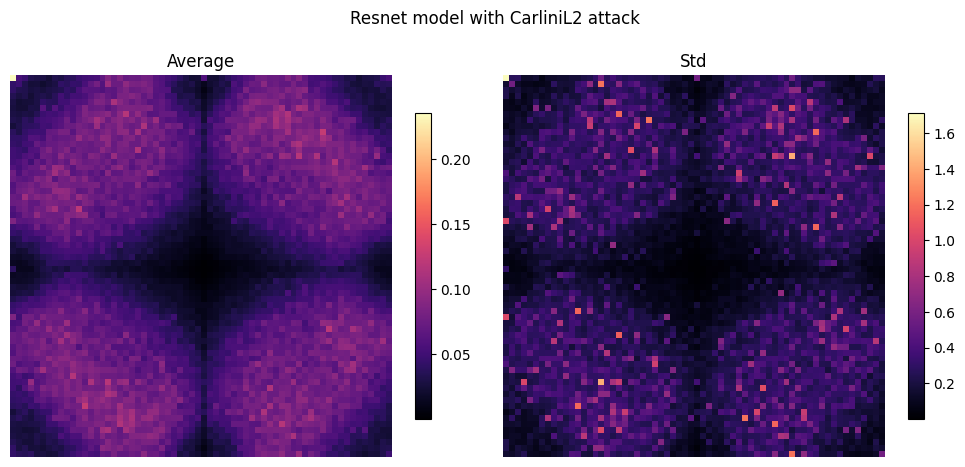

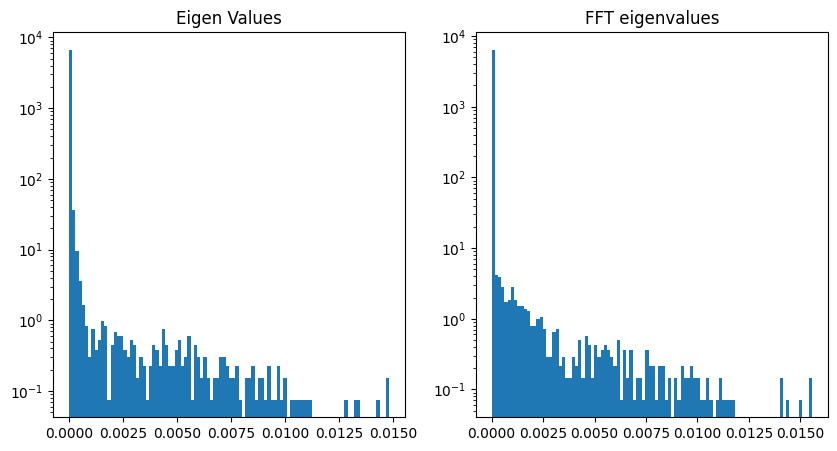

[05/13/24 11:34:10] INFO     Loading data from Resnet_model_Adversarial_FSGM@Dataset            ]8;id=539458;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=981827;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Resnet model with FSGM attack


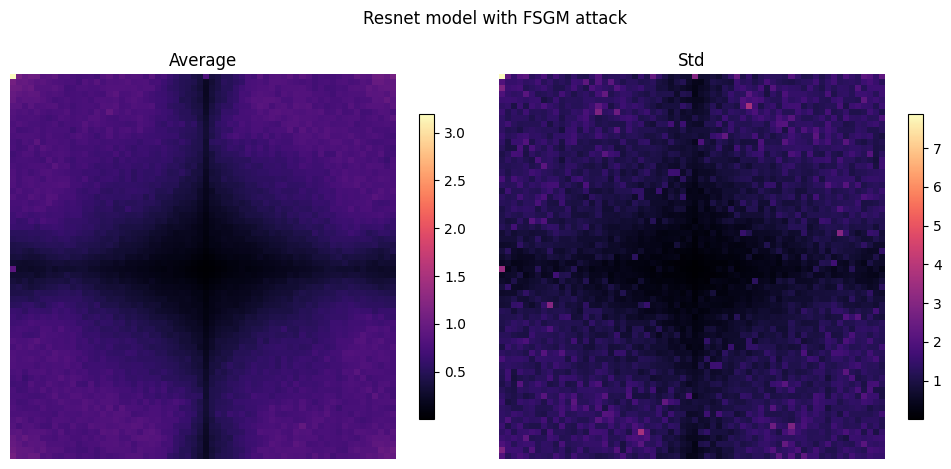

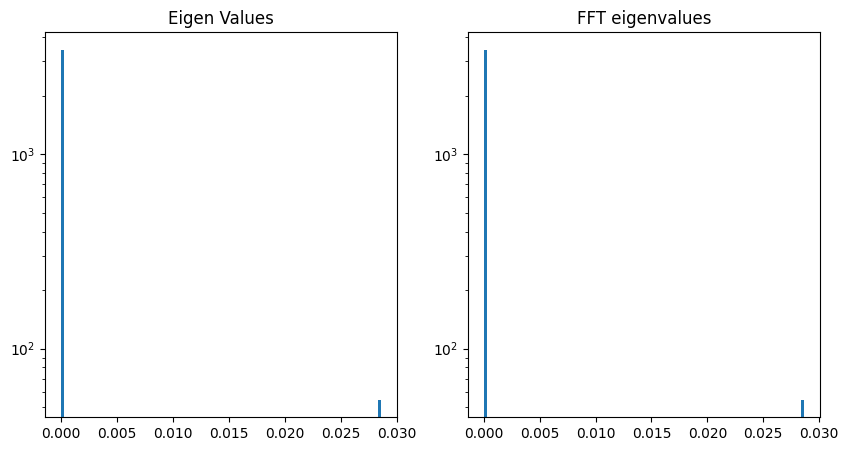

[05/13/24 11:34:15] INFO     Loading data from Resnet_model_Adversarial_PGD@Dataset             ]8;id=511878;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=827123;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Resnet model with PGD attack


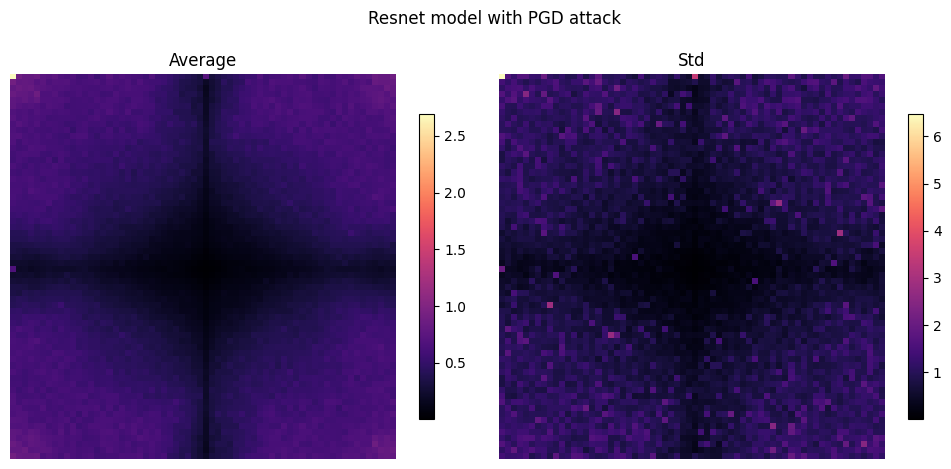

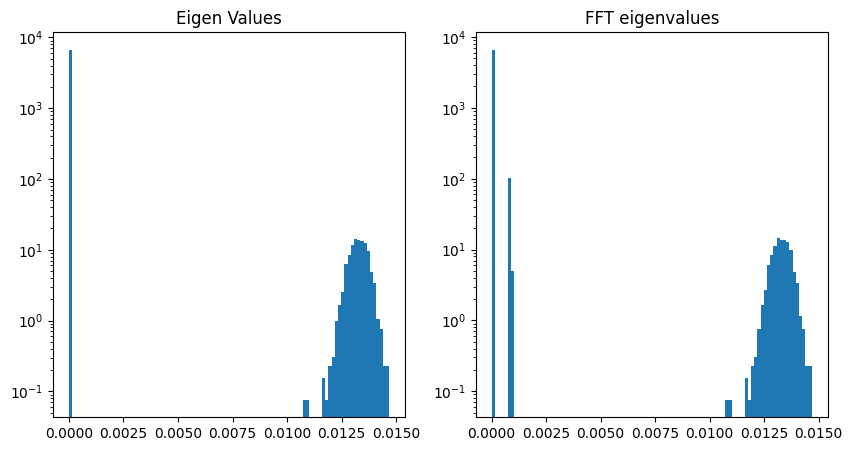

[05/13/24 11:34:21] INFO     Loading data from Regnet_x_model_Adversarial_DeepFool@Dataset      ]8;id=844084;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=510206;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_x model with DeepFool attack


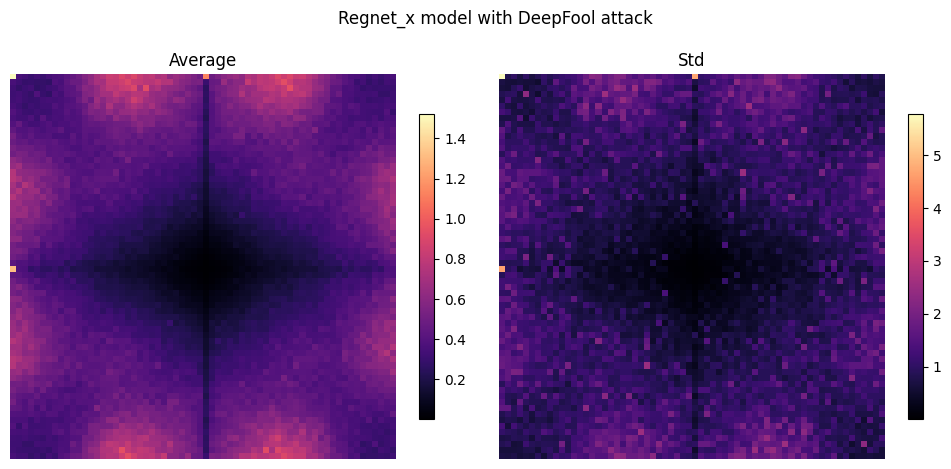

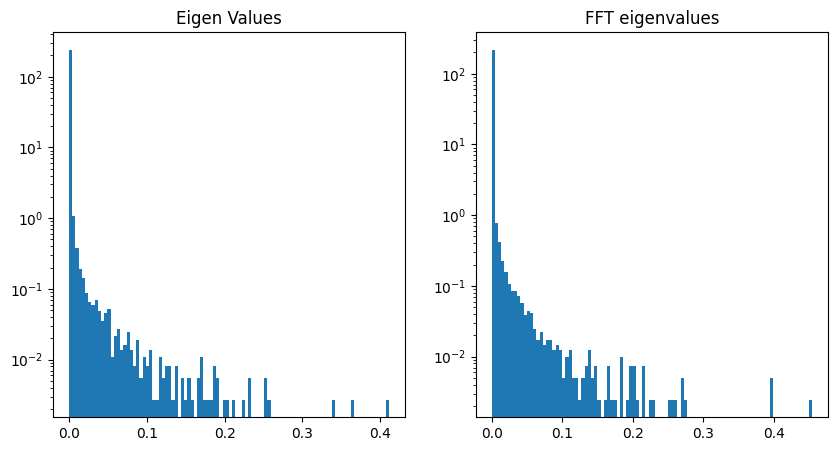

[05/13/24 11:34:27] INFO     Loading data from Regnet_x_model_Adversarial_CarliniL2@Dataset     ]8;id=257921;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=871386;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_x model with CarliniL2 attack


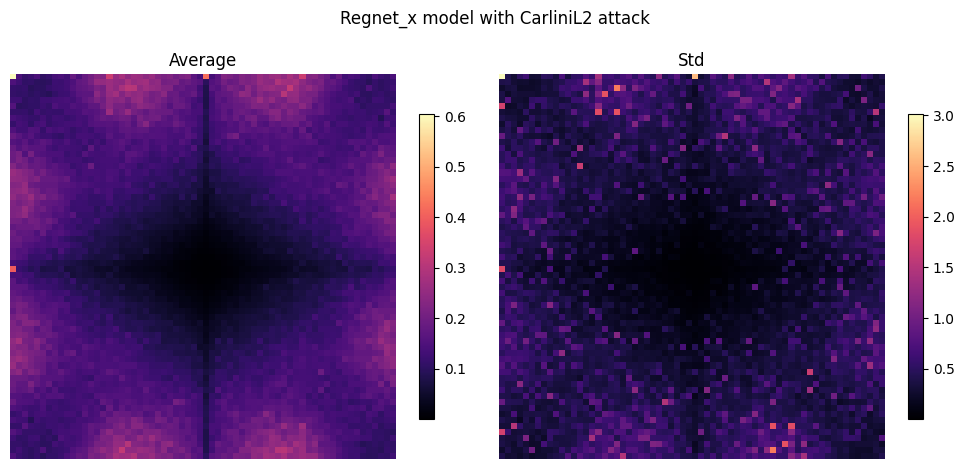

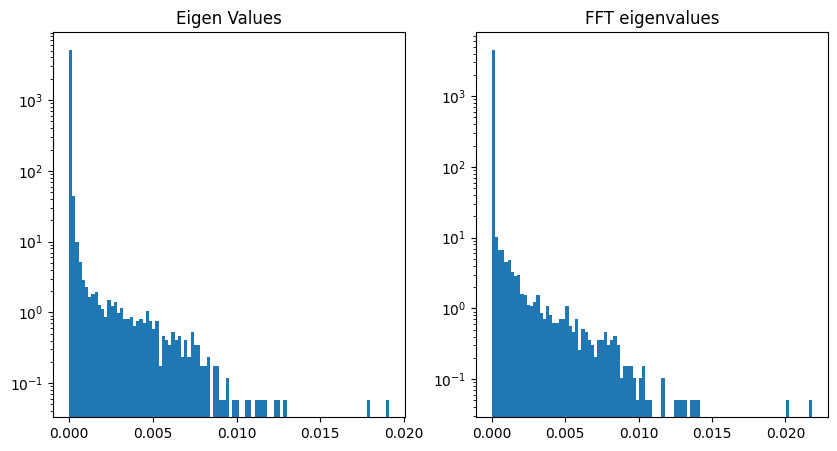

[05/13/24 11:34:32] INFO     Loading data from Regnet_x_model_Adversarial_FSGM@Dataset          ]8;id=670728;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=935502;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_x model with FSGM attack


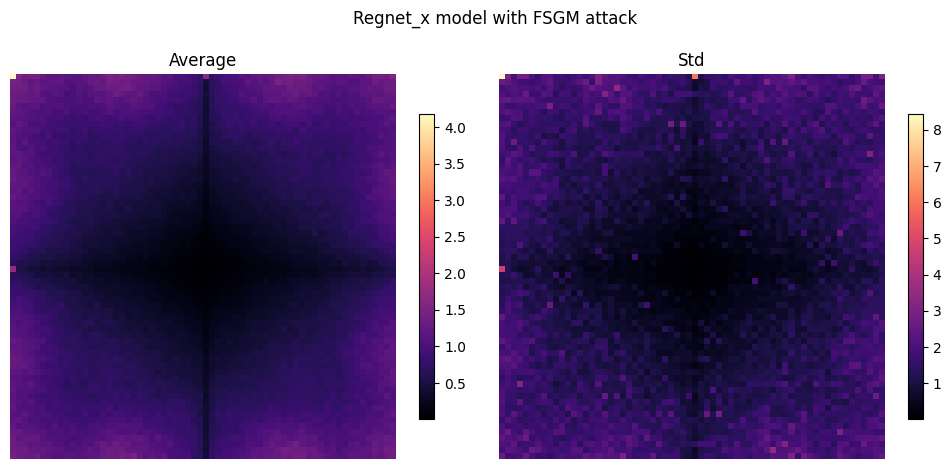

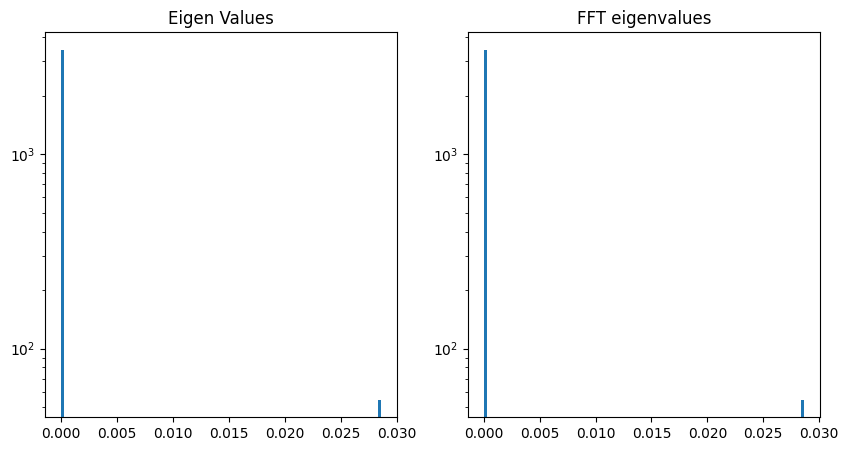

[05/13/24 11:34:38] INFO     Loading data from Regnet_x_model_Adversarial_PGD@Dataset           ]8;id=44732;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=651798;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_x model with PGD attack


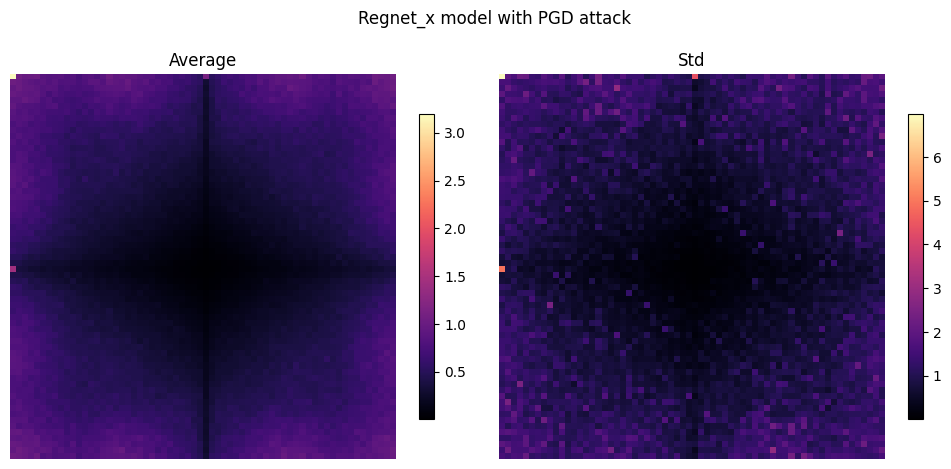

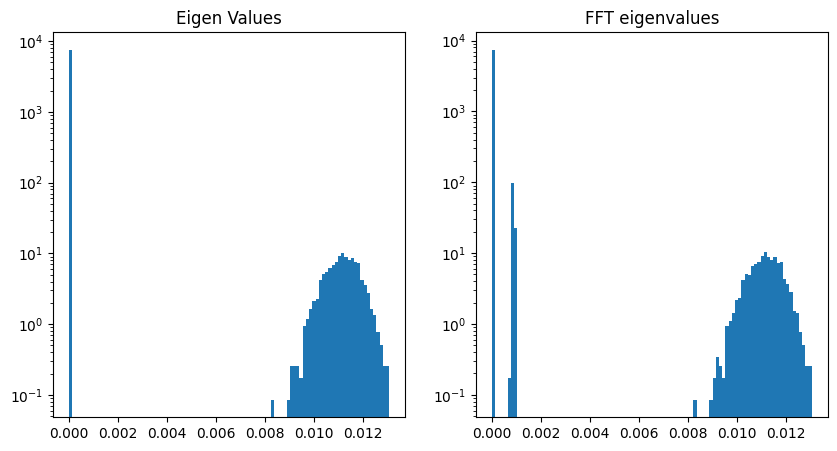

[05/13/24 11:34:43] INFO     Loading data from Regnet_y_model_Adversarial_DeepFool@Dataset      ]8;id=967203;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=971019;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_y model with DeepFool attack


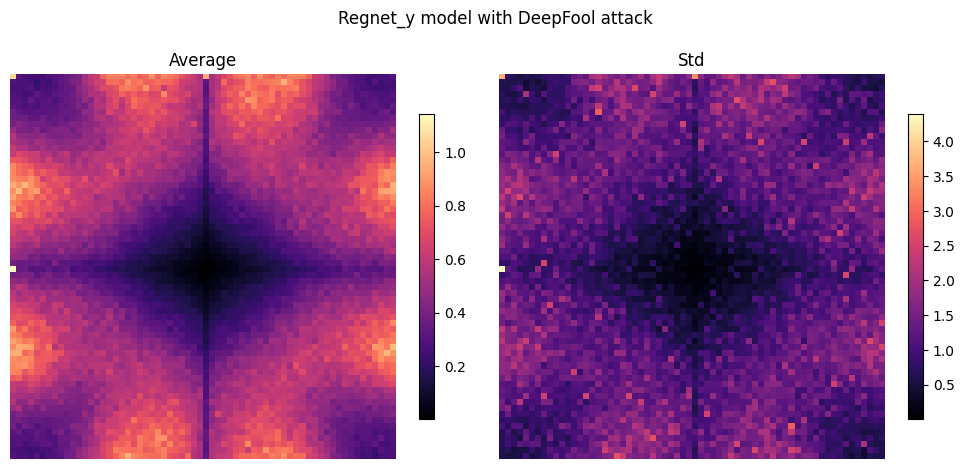

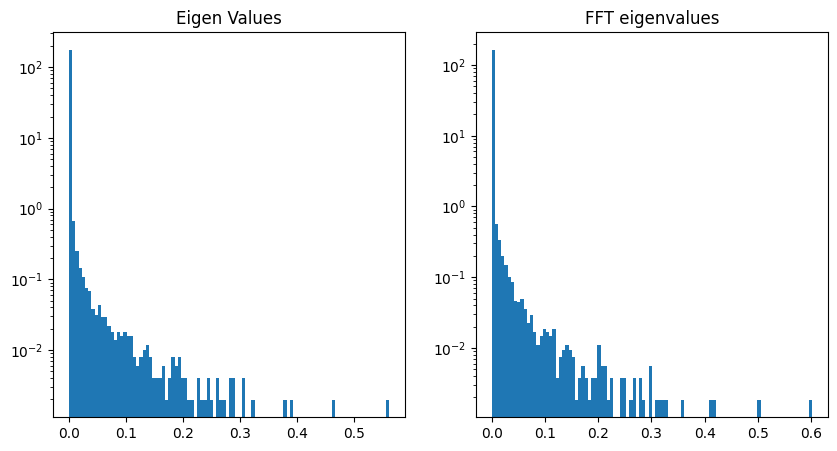

[05/13/24 11:34:49] INFO     Loading data from Regnet_y_model_Adversarial_CarliniL2@Dataset     ]8;id=778534;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=621975;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_y model with CarliniL2 attack


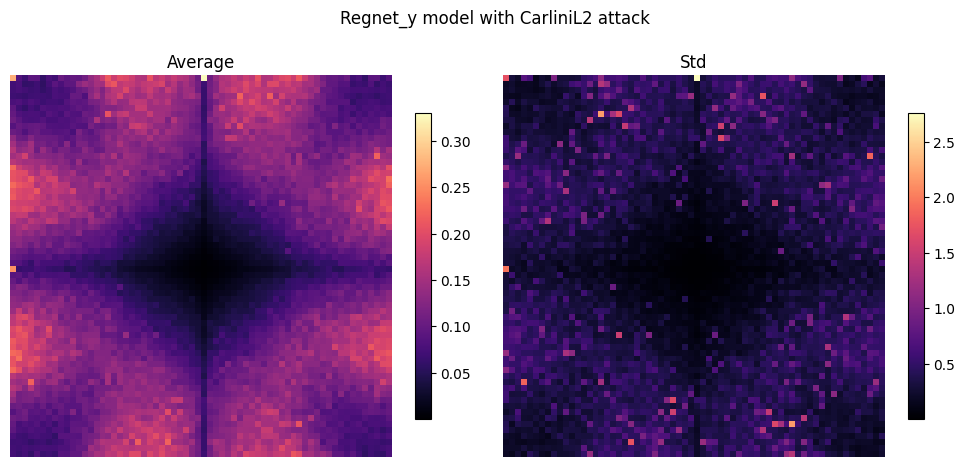

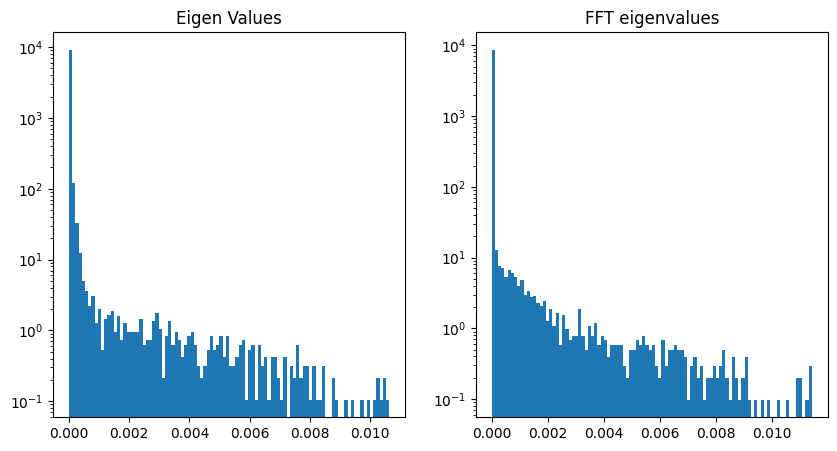

[05/13/24 11:34:54] INFO     Loading data from Regnet_y_model_Adversarial_FSGM@Dataset          ]8;id=911629;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=226862;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_y model with FSGM attack


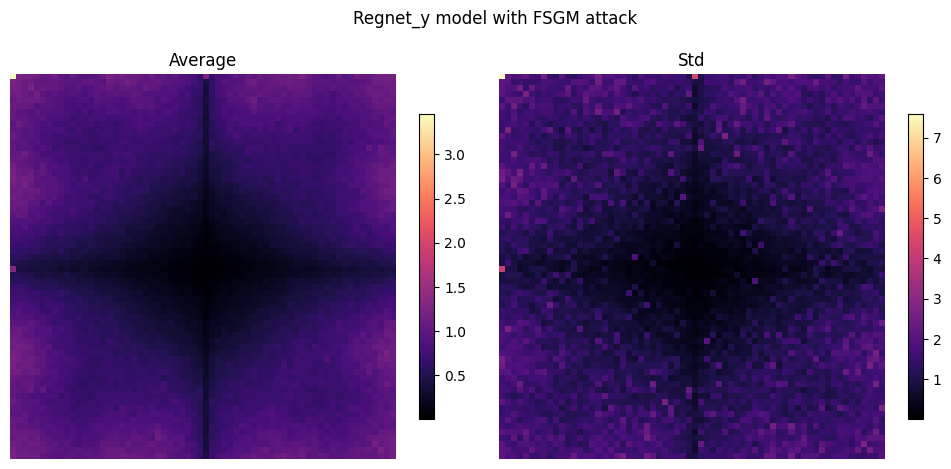

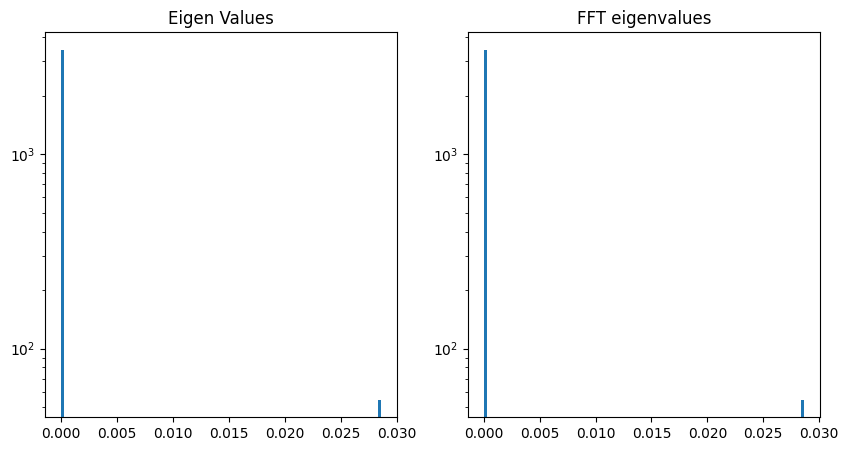

[05/13/24 11:35:00] INFO     Loading data from Regnet_y_model_Adversarial_PGD@Dataset           ]8;id=332757;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=900854;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_y model with PGD attack


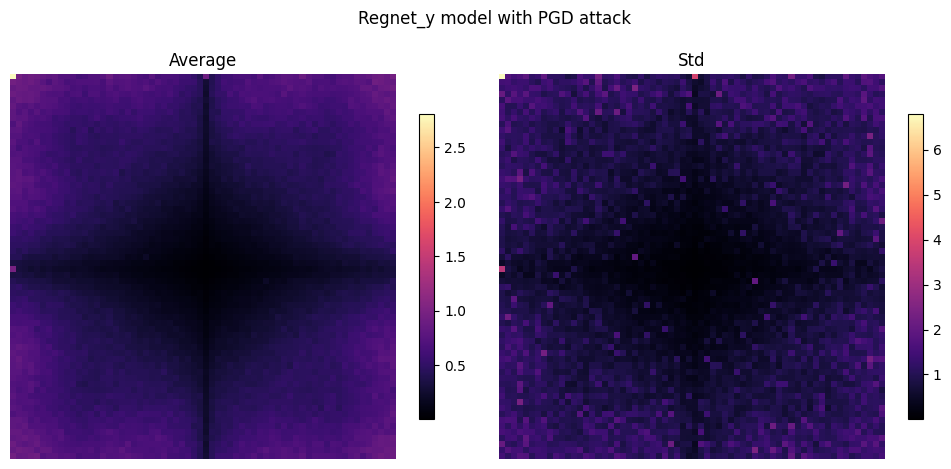

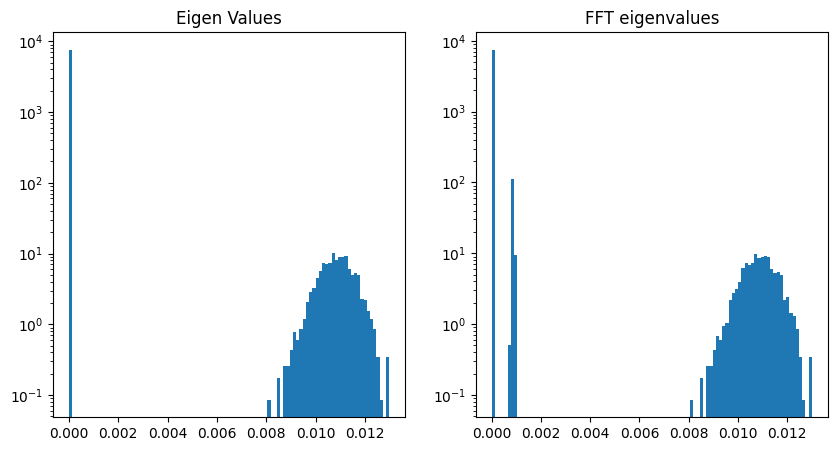

In [4]:

image_size = catalog.load("params:Data_information.input_shape")
for result in generate_FFT_report(attacks,models,image_size,dataset = 'arch',display=False):
    plot_eigen_values(result[1])

In [5]:
%reload_kedro --env base

[05/13/24 11:35:06] INFO     Resolved project path as:                                              ]8;id=832630;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=18036;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#146\146]8;;\
                             /home/jamontanac/Documents/AdversarialExamples/adversarialexamples.                   
                             To set a different path, run '%reload_kedro <project_root>'                           

                    INFO     Kedro project AdversarialExamples                                      ]8;id=61249;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=755121;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#115\115]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=891012;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=672399;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#116\116]8;;\
                             'pipelines'                                                                           

                    INFO     Registered line magic 'run_viz'                                        ]8;id=549071;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=344798;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#122\122]8;;\

                    INFO     Loading data from params:Data_information.input_shape              ]8;id=701635;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=562337;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (MemoryDataset)...                                                                    

                    INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=281412;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=852623;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Resnet model with DeepFool attack


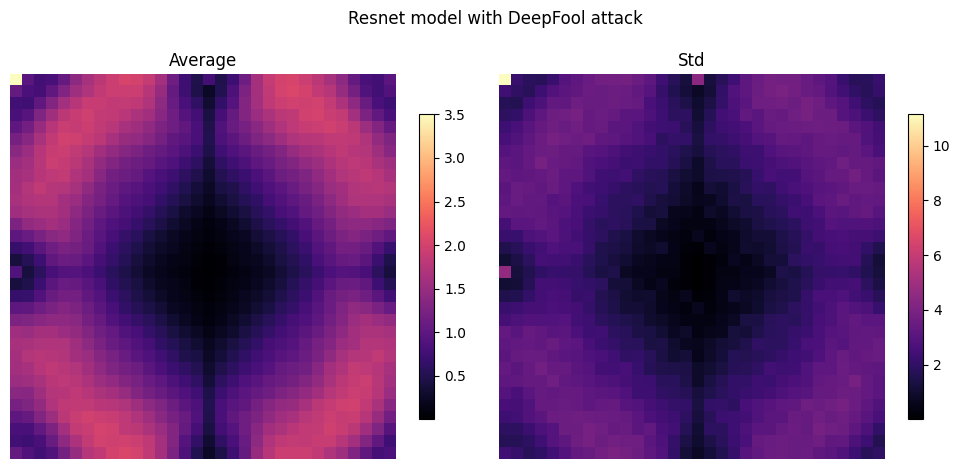

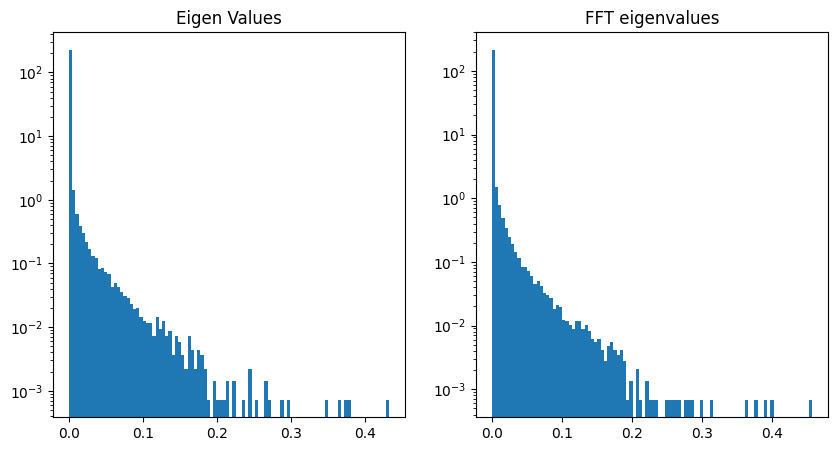

[05/13/24 11:35:14] INFO     Loading data from Resnet_model_Adversarial_CarliniL2@Dataset       ]8;id=449914;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=990887;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Resnet model with CarliniL2 attack


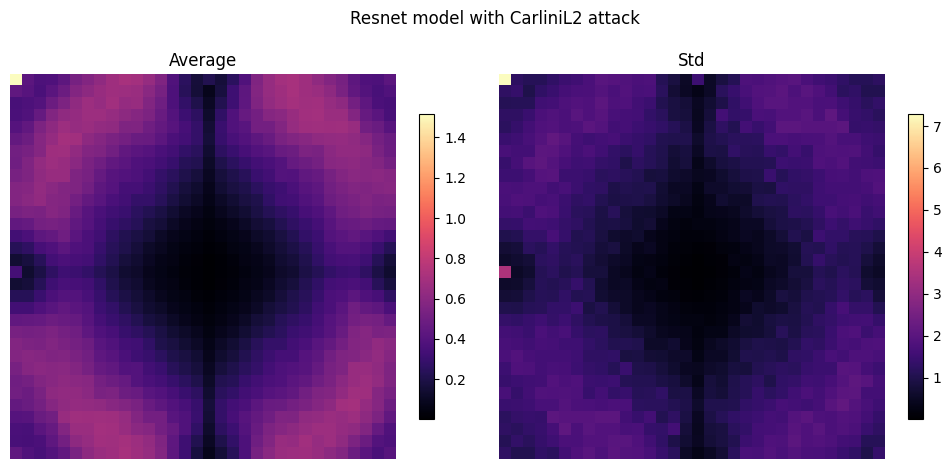

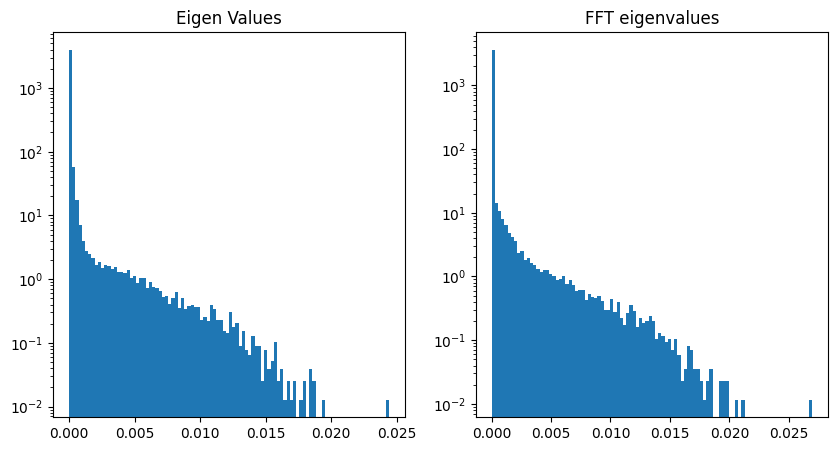

[05/13/24 11:35:21] INFO     Loading data from Resnet_model_Adversarial_FSGM@Dataset            ]8;id=814758;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=698927;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Resnet model with FSGM attack


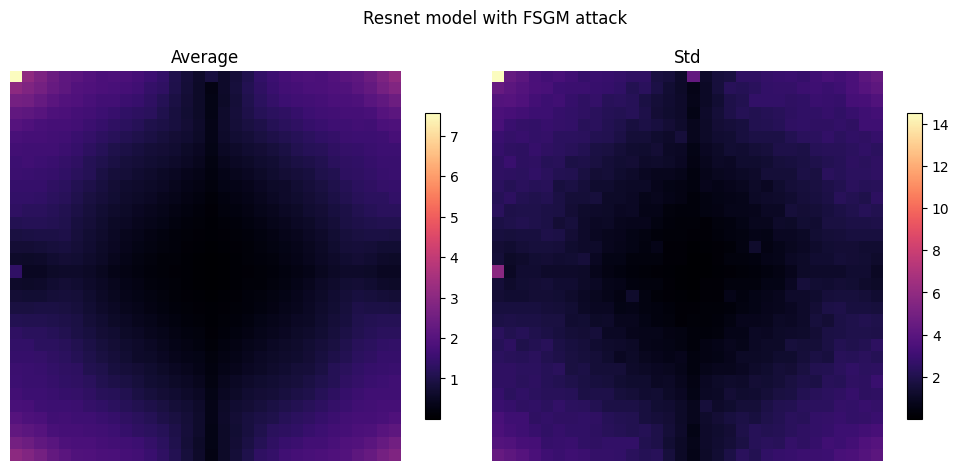

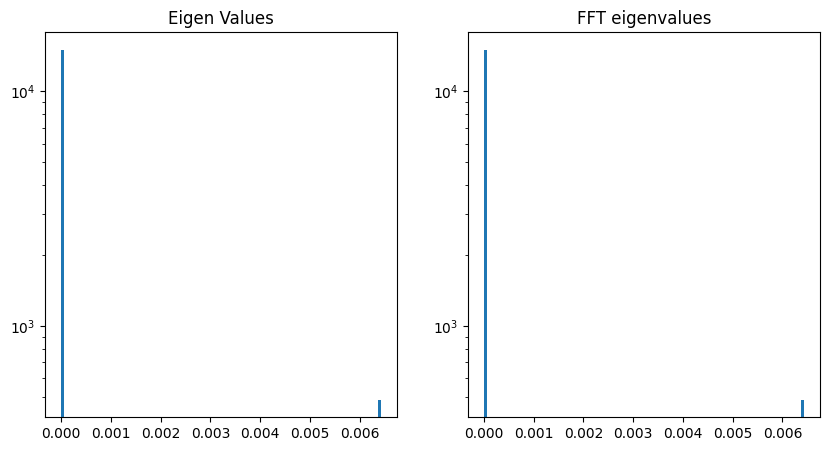

[05/13/24 11:35:28] INFO     Loading data from Resnet_model_Adversarial_PGD@Dataset             ]8;id=560921;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=425893;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Resnet model with PGD attack


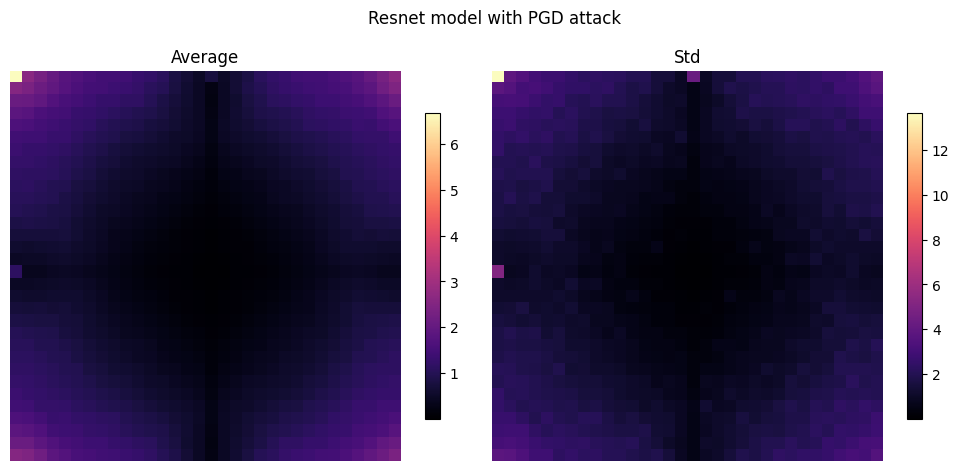

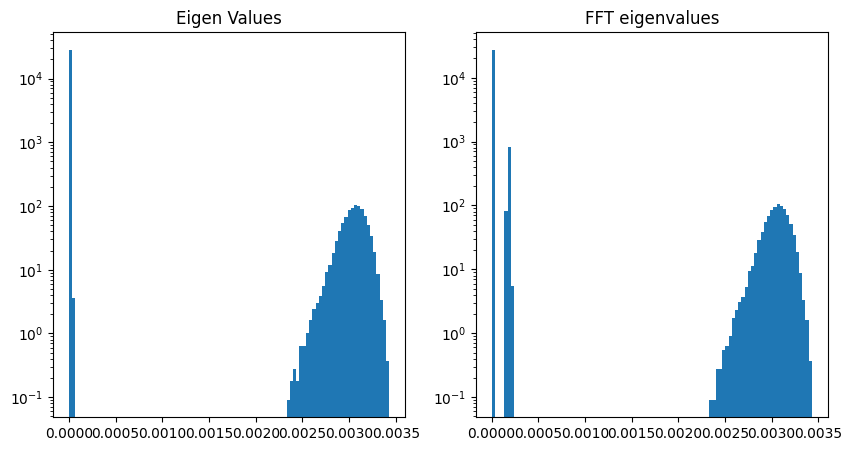

[05/13/24 11:35:36] INFO     Loading data from Regnet_x_model_Adversarial_DeepFool@Dataset      ]8;id=389612;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=421171;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_x model with DeepFool attack


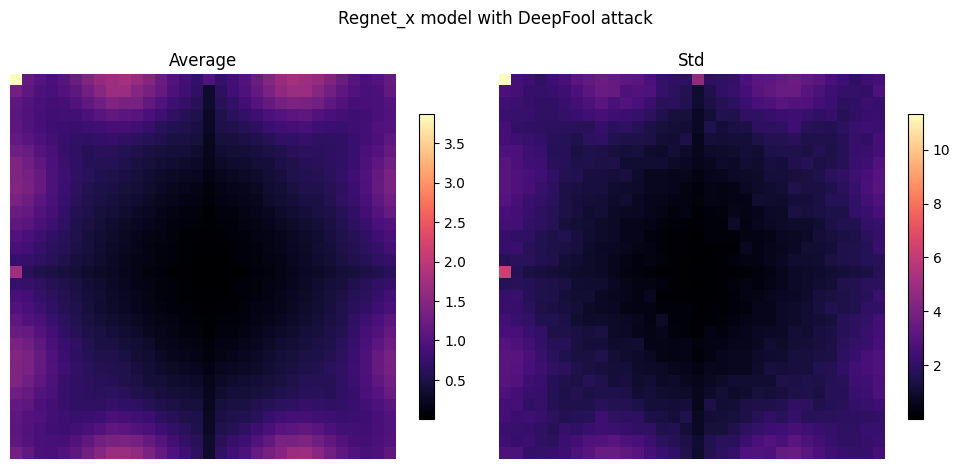

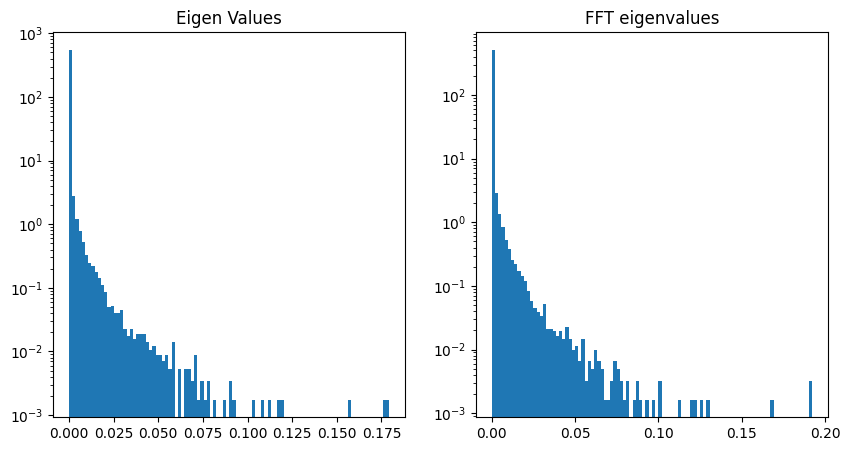

[05/13/24 11:35:44] INFO     Loading data from Regnet_x_model_Adversarial_CarliniL2@Dataset     ]8;id=788629;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=267359;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_x model with CarliniL2 attack


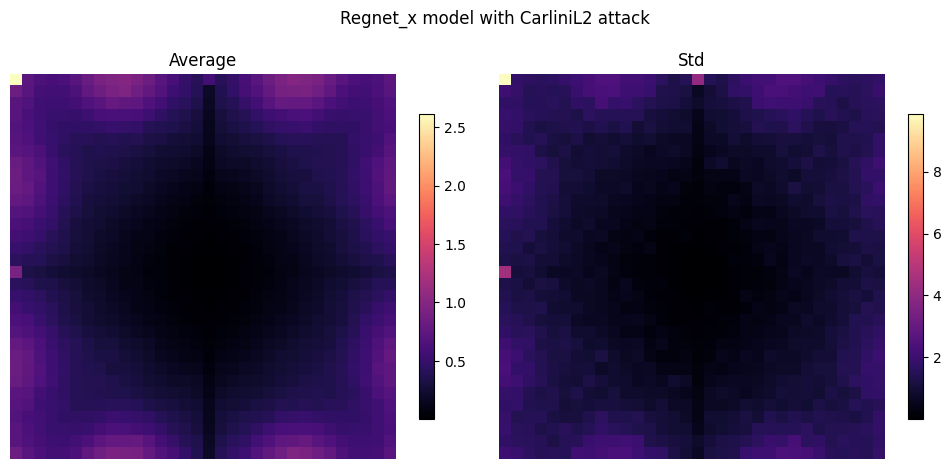

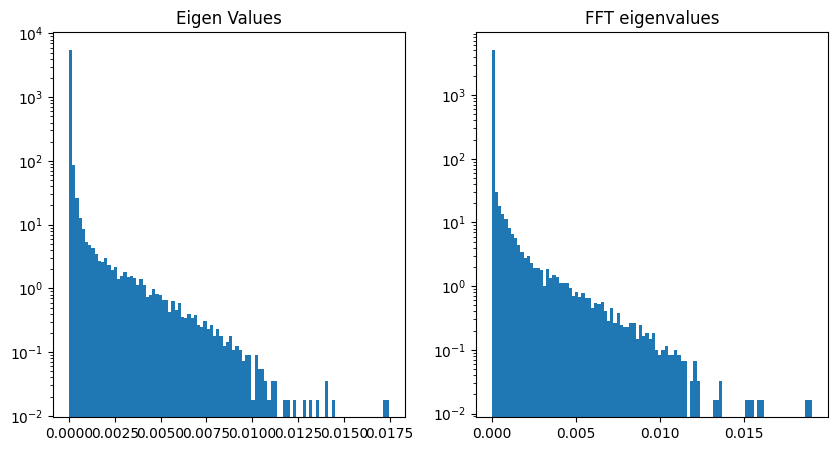

[05/13/24 11:35:51] INFO     Loading data from Regnet_x_model_Adversarial_FSGM@Dataset          ]8;id=478905;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=540506;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_x model with FSGM attack


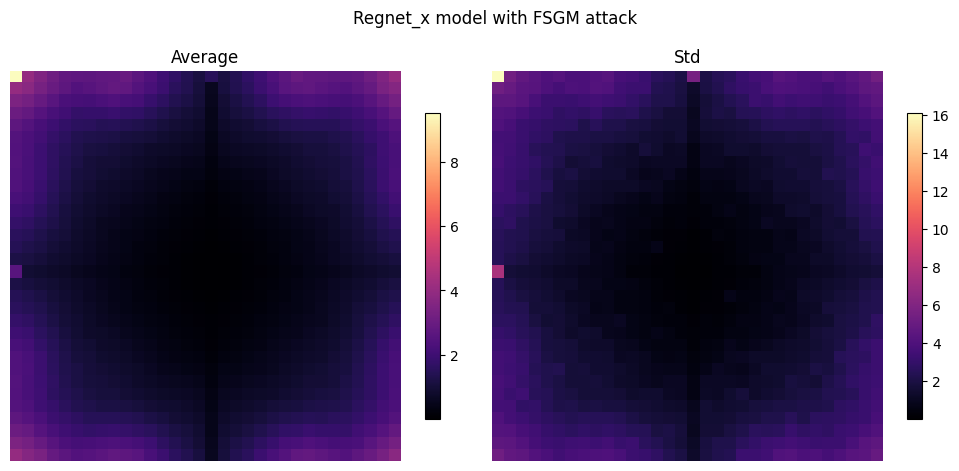

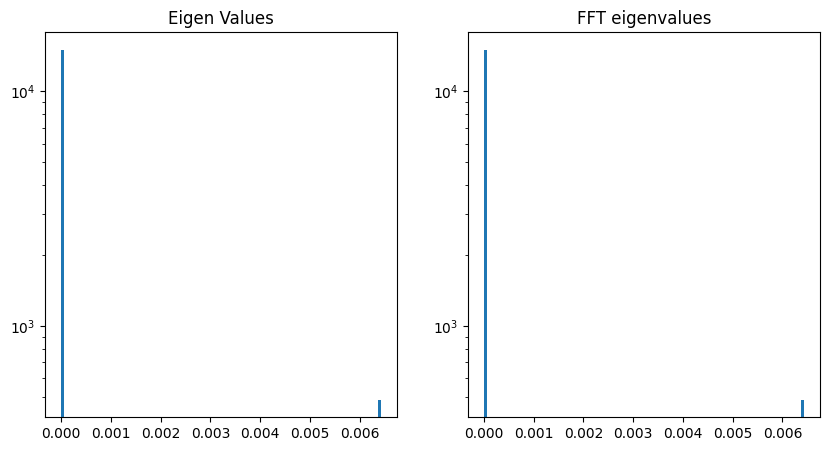

[05/13/24 11:35:58] INFO     Loading data from Regnet_x_model_Adversarial_PGD@Dataset           ]8;id=966102;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=279167;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_x model with PGD attack


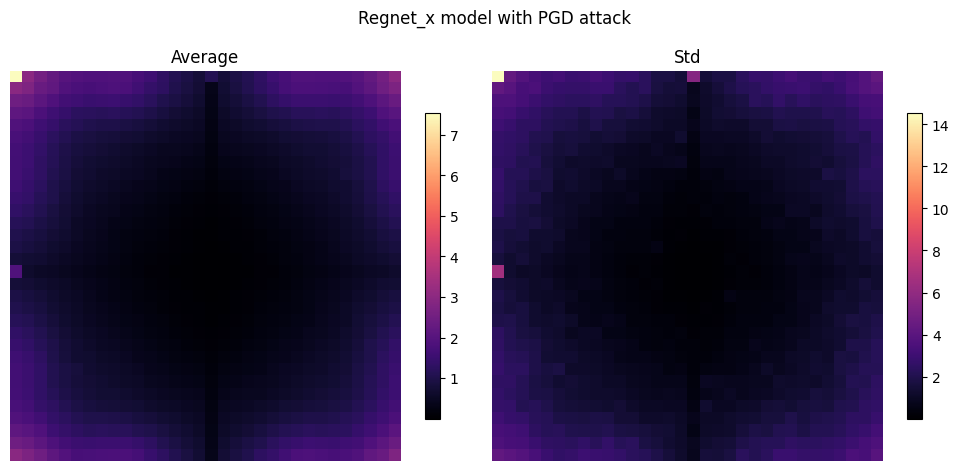

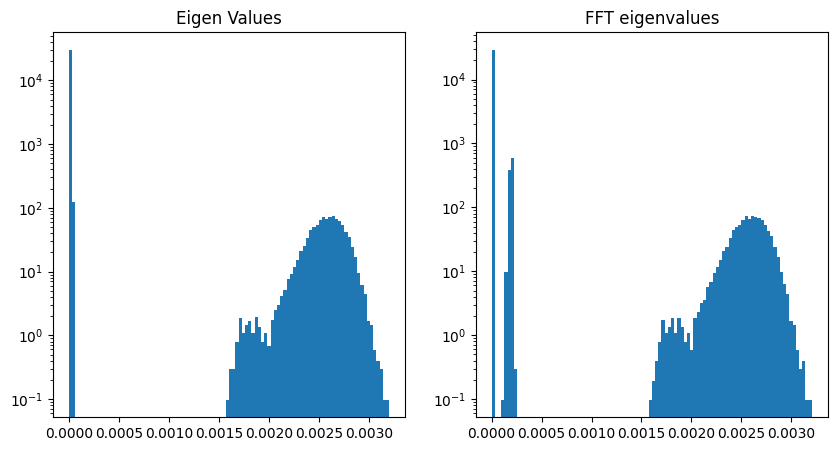

[05/13/24 11:36:06] INFO     Loading data from Regnet_y_model_Adversarial_DeepFool@Dataset      ]8;id=831114;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=487015;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_y model with DeepFool attack


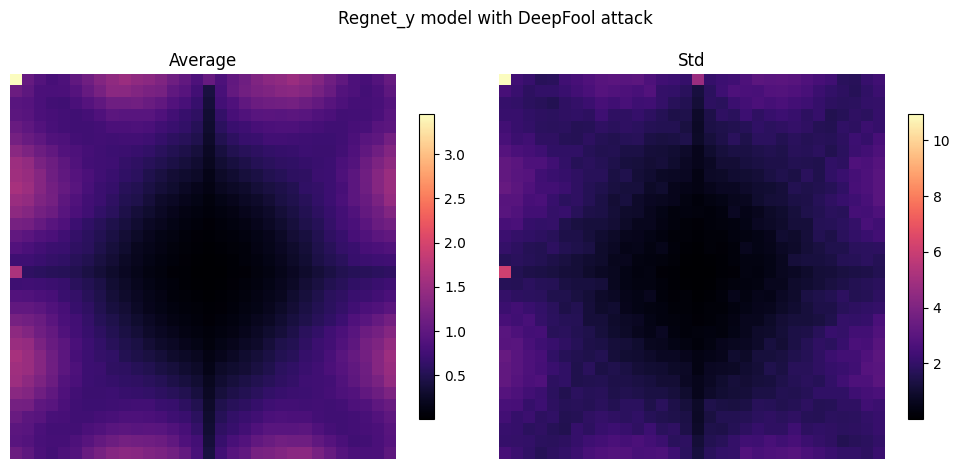

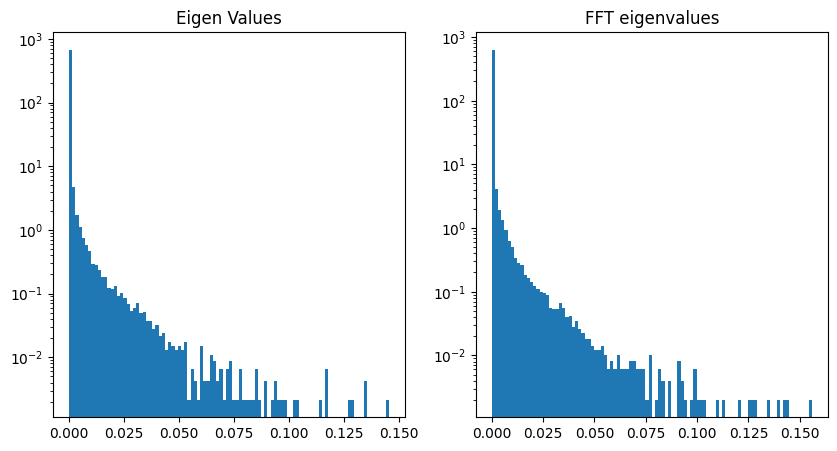

[05/13/24 11:36:14] INFO     Loading data from Regnet_y_model_Adversarial_CarliniL2@Dataset     ]8;id=716055;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=731392;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_y model with CarliniL2 attack


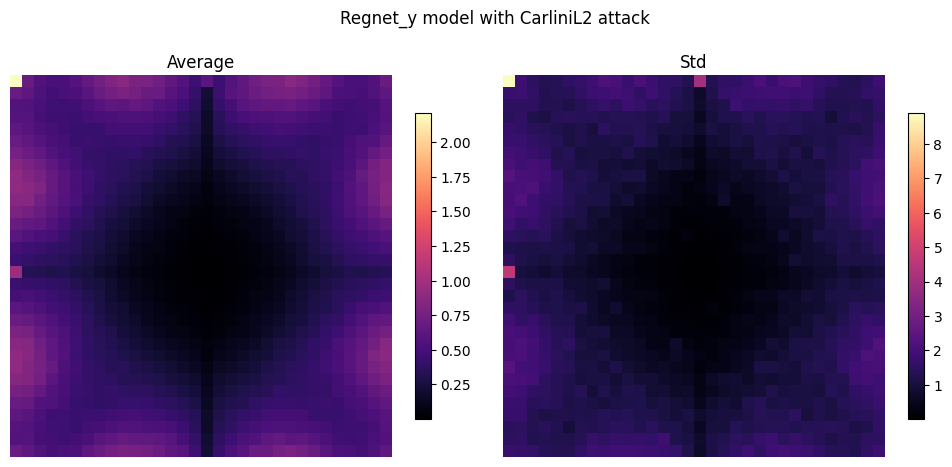

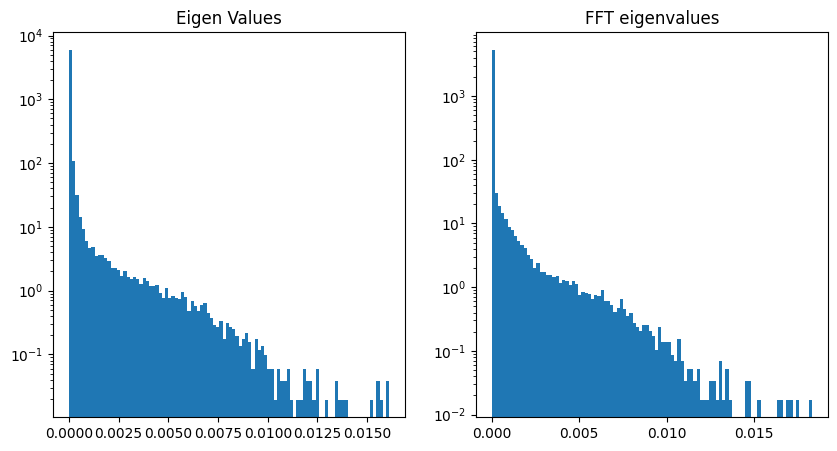

[05/13/24 11:36:21] INFO     Loading data from Regnet_y_model_Adversarial_FSGM@Dataset          ]8;id=876780;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=924022;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_y model with FSGM attack


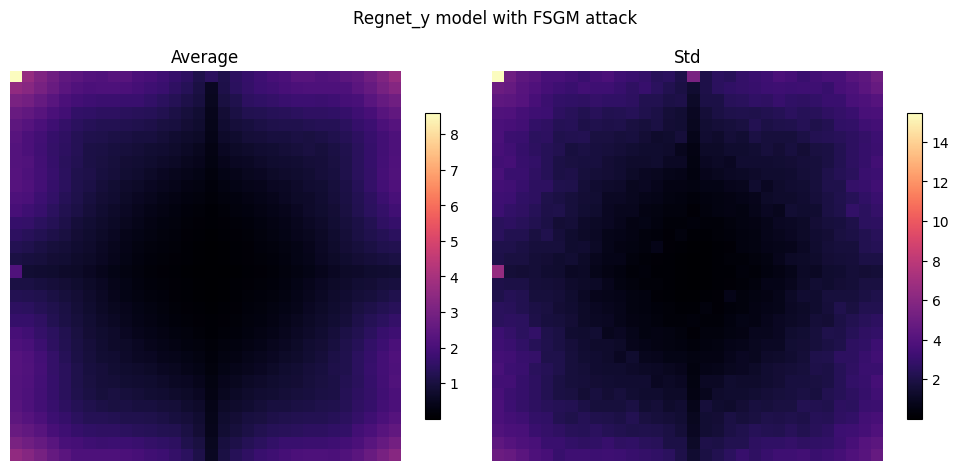

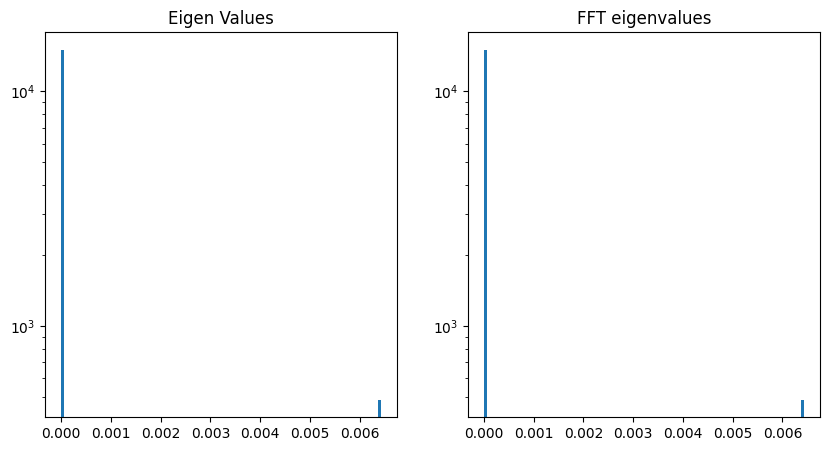

[05/13/24 11:36:29] INFO     Loading data from Regnet_y_model_Adversarial_PGD@Dataset           ]8;id=61833;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=777735;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Regnet_y model with PGD attack


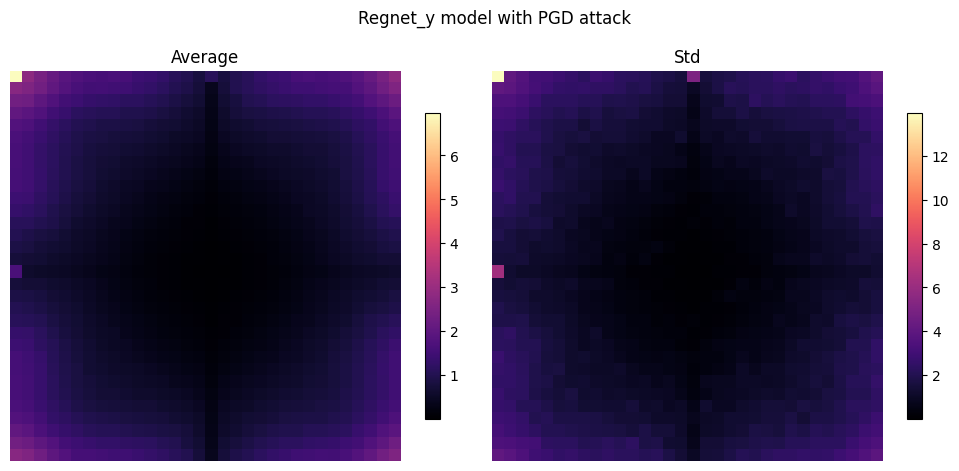

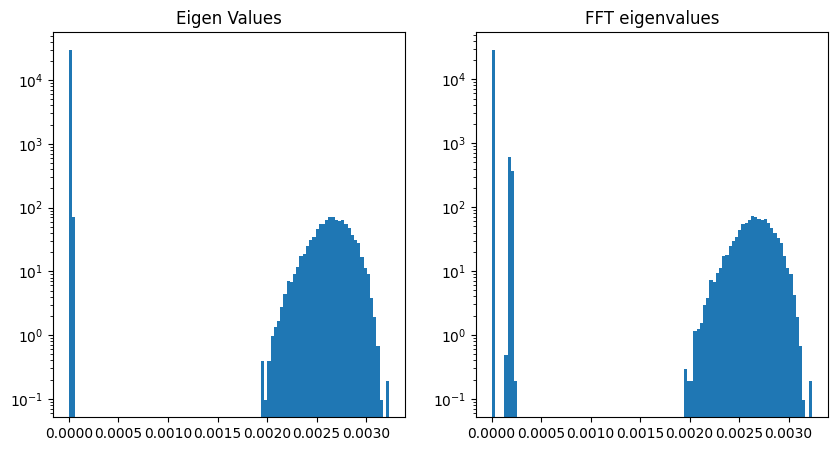

In [6]:
image_size = catalog.load("params:Data_information.input_shape")
for result in generate_FFT_report(attacks,models,image_size,dataset = 'cifar',display=False):
    plot_eigen_values(result[1])

# Explore the eigenvectors

In [29]:
%reload_kedro --env intel

[05/09/24 22:35:57] INFO     Resolved project path as:                                              ]8;id=501280;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=198851;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#146\146]8;;\
                             /home/jamontanac/Documents/AdversarialExamples/adversarialexamples.                   
                             To set a different path, run '%reload_kedro <project_root>'                           

[05/09/24 22:35:58] INFO     Kedro project AdversarialExamples                                      ]8;id=154555;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=366499;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#115\115]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=479087;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=199043;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#116\116]8;;\
                             'pipelines'                                                                           

                    INFO     Registered line magic 'run_viz'                                        ]8;id=673895;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=824213;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#122\122]8;;\

In [1]:

import torch
import itertools as it
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio


#implement a 2d FFT for an image using pytorch
def randomFFT(image,log=True):
    """
    Apply 2D FFT to a given image.
    img: a tensor of shape (C, H, W)
    """
    # Convert the image to grayscale
    gray_image = torch.mean(image, dim=0, keepdim=True)
    
    # Apply 2D FFT to the grayscale image
    fft = torch.fft.fft2(gray_image, norm="ortho")
    fft = torch.fft.fftshift(fft)
    fft = torch.norm(fft,dim=0) 
    if log:
        fft = torch.log(fft+1e-9)
    
    return fft

def compute_eigen_vector(image,fft_image):
    """
    Compute the eigen vectors of the image and its attack.
    """
    # Convert the image to grayscale
    gray_image = torch.mean(image, dim=0, keepdim=True).squeeze()
    dimensions = gray_image.shape
    gray_image = gray_image@gray_image.T
    fft_image = fft_image@fft_image.T
    eigen_values_image,eigen_vectors_image  = torch.linalg.eig(gray_image)
    eigen_values_fft, eigen_vectors_fft  = torch.linalg.eig(fft_image)
    

    return eigen_vectors_image, eigen_vectors_fft
def compute_eigen_values(image,fft_image,normalize = False):
    """
    Compute the eigen values of the image and its attack.
    """
    # Convert the image to grayscale
    gray_image = torch.mean(image, dim=0, keepdim=True).squeeze()
    dimensions = gray_image.shape
    gray_image = gray_image@gray_image.T
    fft_image = fft_image@fft_image.T
    eigen_values_image  = torch.linalg.eigvals(gray_image)
    eigen_values_fft  = torch.linalg.eigvals(fft_image)
    if normalize:
        eigen_values_image = eigen_values_image/dimensions[0]
        eigen_values_fft = eigen_values_fft/dimensions[0]

    return eigen_values_image, eigen_values_fft
def plot_eigen_values(eigen_values, title = ''):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    # Plot eigen values of noise
    axs[0].hist(eigen_values['eigen_values_noise'], bins=100, density=True)
    axs[0].set_yscale('log')
    axs[0].set_title('Eigen Values')

    # Plot eigen values of the fft of the noise
    axs[1].hist(eigen_values['eigen_values_noise_fft'], bins=100, density=True)
    axs[1].set_yscale('log')
    axs[1].set_title('FFT eigenvalues')

    plt.show()
def plot_eigen_vectors(avg_eigen_vectors,std_eigen_vectors,title = '',dataset="intel",display=False):

    avg_matrix = avg_eigen_vectors
    std_matrix = std_eigen_vectors
    log_avg_matrix = np.log1p(avg_matrix)
    log_std_matrix = np.log1p(std_matrix)
    x = np.arange(avg_matrix.shape[1])
    y = np.arange(avg_matrix.shape[0])
    # Create a figure with two subplots
    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{'type': 'surface'}, {'type': 'surface'}]],
        subplot_titles=('avg eigenvectors', 'std_eigen_vectors'),
        horizontal_spacing=0.1,
        vertical_spacing=0.1
    )

    # Add first surface plot
    fig.add_trace(
        go.Surface(z=log_avg_matrix, x=x, y=y, colorscale='Cividis',colorbar=dict(title='Log(Z)', x=0.42)),
        row=1, col=1
    )

    # Add second surface plot
    fig.add_trace(
        go.Surface(z=log_std_matrix, x=x, y=y, colorscale='Cividis',colorbar=dict(title='Log10(Z2)', x=1.02)),
        row=1, col=2
    )
    camera1 = dict(
        eye=dict(x=2.25, y=1.25, z=0.25)
    )
    camera2 = dict(
        eye=dict(x=1.25, y=1.25, z=1.25)
    )
    # Update layout, labels, and titles
    fig.update_layout(
        title=title,
        width=1200,  # Increase figure width
        height=600,  # Increase figure height
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Log(AVG)',
            camera=camera1
        ),
        scene2=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Log(STD)',
            camera=camera2
        ),
        autosize=True
    )
    if display:
        fig.show()
    else:
        pio.write_image(fig, f"Results_images/{dataset}/{title}.png")



def generate_eigen_vector_report(models,attacks,folder,image_size):
    
    for model, attack in it.product(models, attacks):
        adver = catalog.load(f'{model}_model_Adversarial_{attack}@Dataset')
        #get adversarial and original images
        original_images = adver['original']
        adversarial_images = adver['examples']
        average_eigen_vector = torch.zeros(*image_size)
        #average_eigen_vector_fft = torch.zeros(*image_size)
        std_eigen_vectors = torch.zeros(*image_size)
        num_images = 0
        for i in range(len(original_images)):
            original_image = original_images[i]
            adversarial_image = adversarial_images[i]
            noise_fft = randomFFT(torch.abs(adversarial_image-original_image),log=False)
            original_fft = randomFFT(original_image)
            adversarial_fft = randomFFT(adversarial_image)
            difference = torch.abs(adversarial_fft - original_fft)
            eigen_image_noise, eigen_fft_image_noise = compute_eigen_vector(torch.abs(adversarial_image-original_image),noise_fft)
            std_eigen_vectors += torch.real(eigen_image_noise)**2
            average_eigen_vector += torch.real(eigen_image_noise)

            # average_eigen_vector_fft += torch.real(eigen_fft_image_noise)
            num_images += 1
        average_eigen_vector /= num_images
        std_eigen_vectors = torch.sqrt(std_eigen_vectors/num_images - average_eigen_vector**2)
        # average_eigen_vector_fft /= num_images
        plot_eigen_vectors(average_eigen_vector,std_eigen_vectors,title=f"{model} model with {attack} attack",dataset=folder,display=False)

#plot eigen vectors


# for result in generate_FFT_report(attacks,models,image_size):
#     plot_eigen_values(result[1])

attacks = ["DeepFool", "CarliniL2", "FSGM", "PGD"]
models = ['Resnet','Regnet_x','Regnet_y']
image_size = catalog.load("params:Data_information.input_shape")
generate_eigen_vector_report(models,attacks,"intel",image_size)

[05/15/24 22:06:37] INFO     Loading data from params:Data_information.input_shape              ]8;id=233907;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=665480;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (MemoryDataset)...                                                                    

                    INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=356515;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=91690;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:06:43] INFO     Loading data from Resnet_model_Adversarial_CarliniL2@Dataset       ]8;id=509210;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=621354;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:06:47] INFO     Loading data from Resnet_model_Adversarial_FSGM@Dataset            ]8;id=614069;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=932514;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:06:53] INFO     Loading data from Resnet_model_Adversarial_PGD@Dataset             ]8;id=67292;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=987437;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:06:59] INFO     Loading data from Regnet_x_model_Adversarial_DeepFool@Dataset      ]8;id=739818;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=570009;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:07:04] INFO     Loading data from Regnet_x_model_Adversarial_CarliniL2@Dataset     ]8;id=615295;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=106323;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:07:09] INFO     Loading data from Regnet_x_model_Adversarial_FSGM@Dataset          ]8;id=217639;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=891896;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:07:15] INFO     Loading data from Regnet_x_model_Adversarial_PGD@Dataset           ]8;id=253750;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=539599;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:07:20] INFO     Loading data from Regnet_y_model_Adversarial_DeepFool@Dataset      ]8;id=194178;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=730905;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:07:26] INFO     Loading data from Regnet_y_model_Adversarial_CarliniL2@Dataset     ]8;id=733662;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=596289;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:07:31] INFO     Loading data from Regnet_y_model_Adversarial_FSGM@Dataset          ]8;id=109834;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=399577;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/15/24 22:07:36] INFO     Loading data from Regnet_y_model_Adversarial_PGD@Dataset           ]8;id=208286;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=935652;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

In [ ]:

%reload_kedro --env arch

In [31]:

image_size = catalog.load("params:Data_information.input_shape")
generate_eigen_vector_report(models,attacks,"arch",image_size)

[05/09/24 22:46:10] INFO     Loading data from params:Data_information.input_shape              ]8;id=516250;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=687105;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (MemoryDataset)...                                                                    

                    INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=642646;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=775619;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:47:06] INFO     Loading data from Resnet_model_Adversarial_CarliniL2@Dataset       ]8;id=817529;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=837642;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:47:40] INFO     Loading data from Resnet_model_Adversarial_FSGM@Dataset            ]8;id=118070;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=390320;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:48:36] INFO     Loading data from Resnet_model_Adversarial_PGD@Dataset             ]8;id=198683;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=79902;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:49:27] INFO     Loading data from Regnet_x_model_Adversarial_DeepFool@Dataset      ]8;id=617097;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=693582;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:50:24] INFO     Loading data from Regnet_x_model_Adversarial_CarliniL2@Dataset     ]8;id=181606;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=177288;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:51:10] INFO     Loading data from Regnet_x_model_Adversarial_FSGM@Dataset          ]8;id=958718;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=201024;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:52:08] INFO     Loading data from Regnet_x_model_Adversarial_PGD@Dataset           ]8;id=204516;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=656731;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:52:58] INFO     Loading data from Regnet_y_model_Adversarial_DeepFool@Dataset      ]8;id=229180;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=838704;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:53:55] INFO     Loading data from Regnet_y_model_Adversarial_CarliniL2@Dataset     ]8;id=938029;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=13448;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:54:38] INFO     Loading data from Regnet_y_model_Adversarial_FSGM@Dataset          ]8;id=211554;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=349858;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:55:35] INFO     Loading data from Regnet_y_model_Adversarial_PGD@Dataset           ]8;id=745488;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=106885;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

In [32]:
%reload_kedro --env base

[05/09/24 22:56:26] INFO     Resolved project path as:                                              ]8;id=724530;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=205143;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#146\146]8;;\
                             /home/jamontanac/Documents/AdversarialExamples/adversarialexamples.                   
                             To set a different path, run '%reload_kedro <project_root>'                           

[05/09/24 22:56:27] INFO     Kedro project AdversarialExamples                                      ]8;id=410370;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=493473;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#115\115]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=616694;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=359653;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#116\116]8;;\
                             'pipelines'                                                                           

                    INFO     Registered line magic 'run_viz'                                        ]8;id=892506;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=957220;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#122\122]8;;\

In [33]:
image_size = catalog.load("params:Data_information.input_shape")
generate_eigen_vector_report(models,attacks,"cifar",image_size)

                    INFO     Loading data from params:Data_information.input_shape              ]8;id=83000;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=352928;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (MemoryDataset)...                                                                    

                    INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=257198;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=106650;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:56:32] INFO     Loading data from Resnet_model_Adversarial_CarliniL2@Dataset       ]8;id=230249;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=641688;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:56:37] INFO     Loading data from Resnet_model_Adversarial_FSGM@Dataset            ]8;id=714682;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=223559;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:56:42] INFO     Loading data from Resnet_model_Adversarial_PGD@Dataset             ]8;id=978978;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=652806;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:56:48] INFO     Loading data from Regnet_x_model_Adversarial_DeepFool@Dataset      ]8;id=916125;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=660380;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:56:53] INFO     Loading data from Regnet_x_model_Adversarial_CarliniL2@Dataset     ]8;id=753797;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=869839;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:56:58] INFO     Loading data from Regnet_x_model_Adversarial_FSGM@Dataset          ]8;id=142718;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=45140;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:57:04] INFO     Loading data from Regnet_x_model_Adversarial_PGD@Dataset           ]8;id=219257;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=957280;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:57:09] INFO     Loading data from Regnet_y_model_Adversarial_DeepFool@Dataset      ]8;id=562806;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=694777;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:57:15] INFO     Loading data from Regnet_y_model_Adversarial_CarliniL2@Dataset     ]8;id=531076;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=862453;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:57:20] INFO     Loading data from Regnet_y_model_Adversarial_FSGM@Dataset          ]8;id=528232;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=160242;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

[05/09/24 22:57:25] INFO     Loading data from Regnet_y_model_Adversarial_PGD@Dataset           ]8;id=733401;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=868645;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

In [41]:
eigen_image_noise.shape

torch.Size([150, 150])

In [2]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [4]:
avg_matrix = average_eigen_vector
std_matrix = std_eigen_vectors
log_avg_matrix = np.log1p(avg_matrix)
log_std_matrix = np.log1p(std_matrix)
x = np.arange(avg_matrix.shape[1])
y = np.arange(avg_matrix.shape[0])
X, Y = np.meshgrid(x, y)

In [22]:
# Create a figure with two subplots
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'surface'}, {'type': 'surface'}]],
    subplot_titles=('avg eigenvectors', 'std_eigen_vectors'),
    horizontal_spacing=0.1,
    vertical_spacing=0.1
)

# Add first surface plot
fig.add_trace(
    go.Surface(z=log_avg_matrix, x=x, y=y, colorscale='Cividis',colorbar=dict(title='Log(Z)', x=0.42)),
    row=1, col=1
)

# Add second surface plot
fig.add_trace(
    go.Surface(z=log_std_matrix, x=x, y=y, colorscale='Cividis',colorbar=dict(title='Log10(Z2)', x=1.02)),
    row=1, col=2
)
camera1 = dict(
    eye=dict(x=2.25, y=1.25, z=0.25)
)
camera2 = dict(
    eye=dict(x=1.25, y=1.25, z=1.25)
)
# Update layout, labels, and titles
fig.update_layout(
    title='3D Surface Plots with Logarithmic Z Axis',
    width=1200,  # Increase figure width
    height=600,  # Increase figure height
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Log(AVG)',
        camera=camera1
    ),
    scene2=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Log(STD)',
        camera=camera2
    ),
    autosize=True
)

# Display the plots
fig.show()

In [46]:
# Create a meshgrid for the X and Y axes based on matrix shape
x = np.arange(matrix.shape[1])
y = np.arange(matrix.shape[0])
X, Y = np.meshgrid(x, y)

# Create a 3D surface plot using Plotly
fig = go.Figure(data=[go.Surface(z=log_matrix, x=x, y=y)])

# Set the layout, labels, and title
fig.update_layout(
    title='3D Surface Plot',
    scene=dict(
        xaxis_title='X axis',
        yaxis_title='Y axis',
        zaxis_title='Z axis'
    ),
    autosize=True
)

# Display the plot
fig.show()

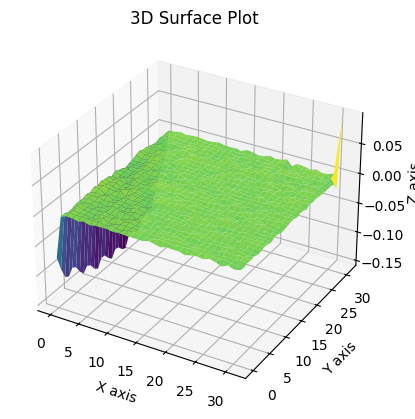

In [28]:
# Plot the surface
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, average_eigen_vector, cmap='viridis')

# Labels and title
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')
ax.set_title('3D Surface Plot')

plt.show()

In [ ]:
def plot_eigen_values(eigen_values, title = ''):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    # Plot eigen values of noise
    axs[0].hist(eigen_values['eigen_values_noise'], bins=100, density=True)
    axs[0].set_yscale('log')
    axs[0].set_title('Eigen Values')

    # Plot eigen values of the fft of the noise
    axs[1].hist(eigen_values['eigen_values_noise_fft'], bins=100, density=True)
    axs[1].set_yscale('log')
    axs[1].set_title('FFT eigenvalues')

    plt.show()

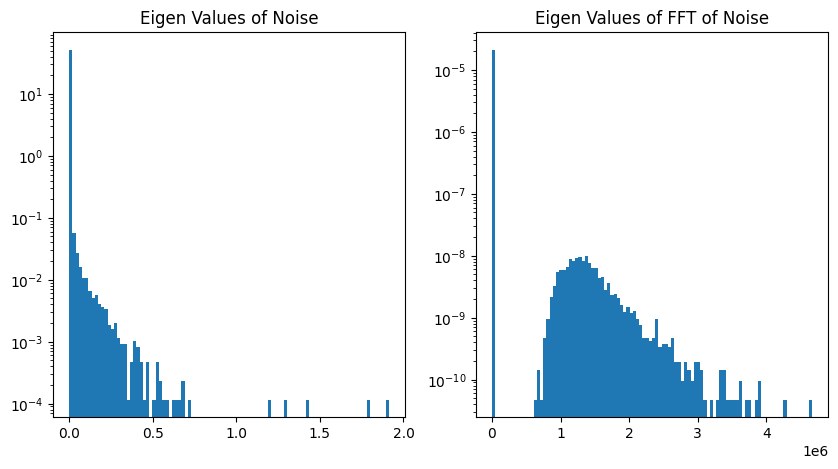

In [25]:

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot eigen values of noise
axs[0].hist(result[1]['eigen_values_noise'], bins=100, density=True)
axs[0].set_yscale('log')
axs[0].set_title('Eigen Values of Noise')

# Plot eigen values of the fft of the noise
axs[1].hist(result[1]['eigen_values_noise_fft'], bins=100, density=True)
axs[1].set_yscale('log')
axs[1].set_title('Eigen Values of FFT of Noise')

plt.show()

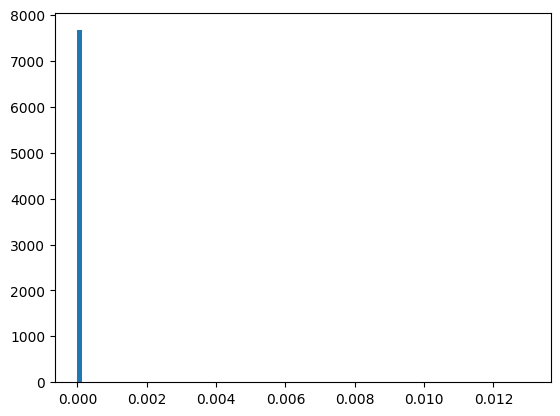

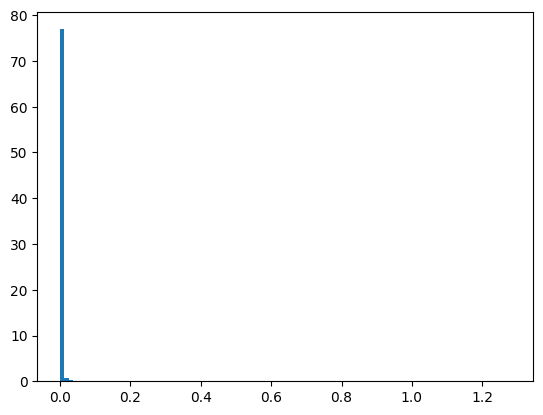

In [8]:
plt.hist(result[1]['eigen_values_log_diff'],bins=100,density=True)
plt.show()
plt.hist(torch.log1p(result[1]['eigen_values_log_diff_fft']),bins=100,density=True)
plt.show()

In [73]:
torch.mean(original_image, dim=0, keepdim=True).squeeze().shape

torch.Size([150, 150])

[05/04/24 19:49:17] INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=738462;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=681827;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

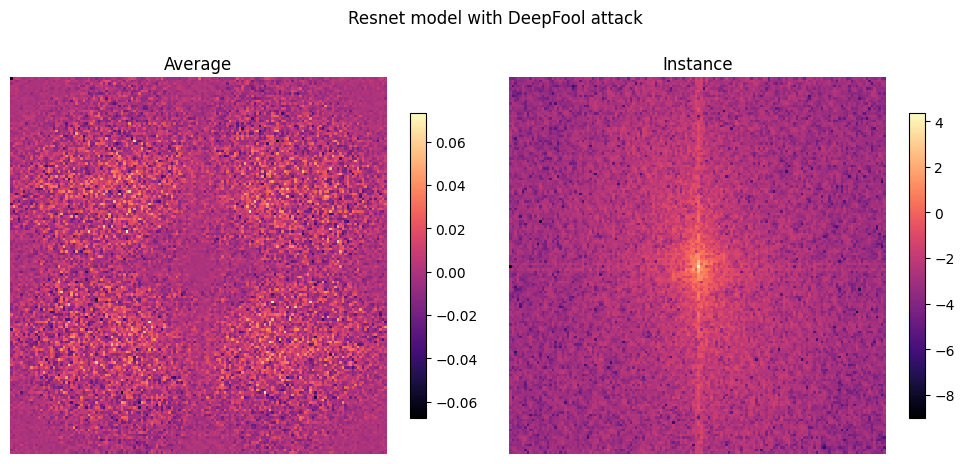

In [64]:

generate_FFT_report(attacks,models,image_size,magnitude=False) 

[05/04/24 19:43:54] INFO     Loading data from params:Report_params.Classes_names               ]8;id=901259;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=452693;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (MemoryDataset)...                                                                    

                    INFO     Loading data from params:Data_information.input_shape              ]8;id=724602;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=8697;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (MemoryDataset)...                                                                    

                    INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=434024;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=983530;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

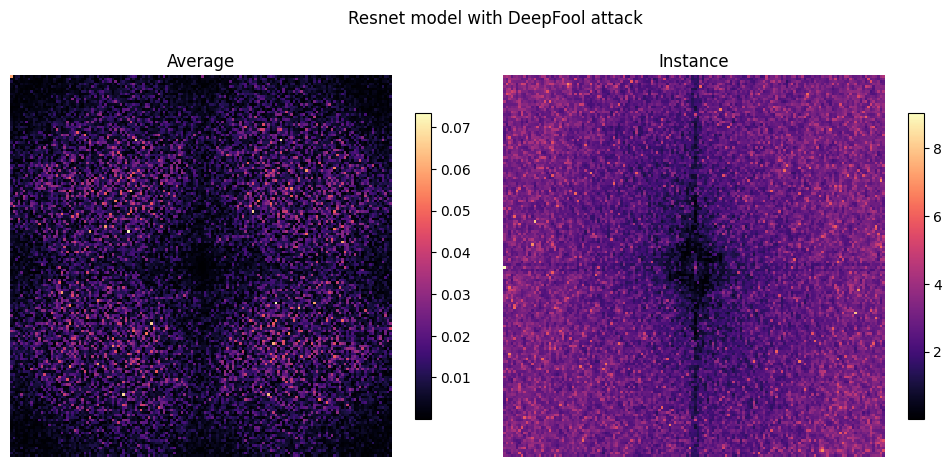

[05/04/24 19:44:06] INFO     Loading data from Resnet_model_Adversarial_CarliniL2@Dataset       ]8;id=143368;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=925728;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

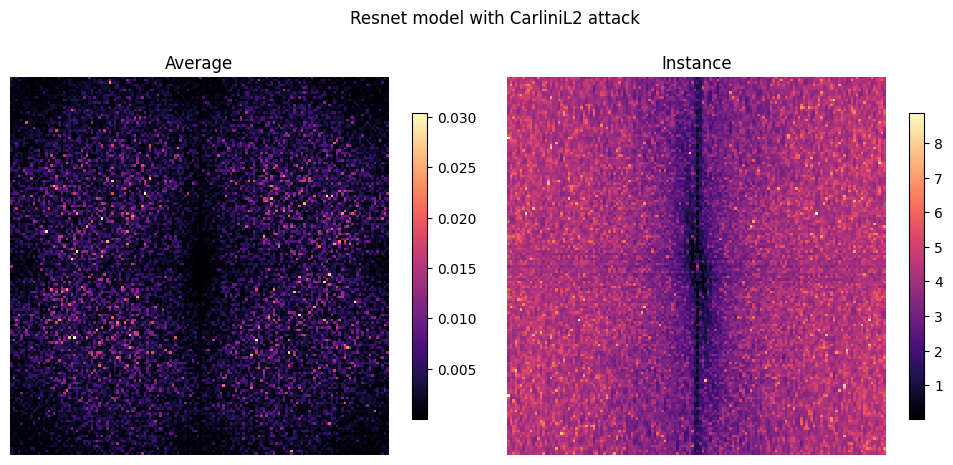

[05/04/24 19:44:18] INFO     Loading data from Resnet_model_Adversarial_FSGM@Dataset            ]8;id=388626;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=55655;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

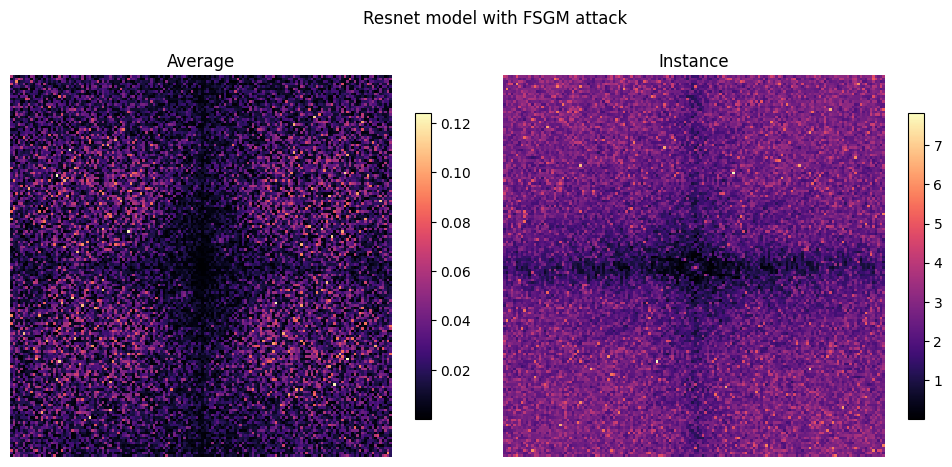

[05/04/24 19:44:31] INFO     Loading data from Resnet_model_Adversarial_PGD@Dataset             ]8;id=137918;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=233852;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

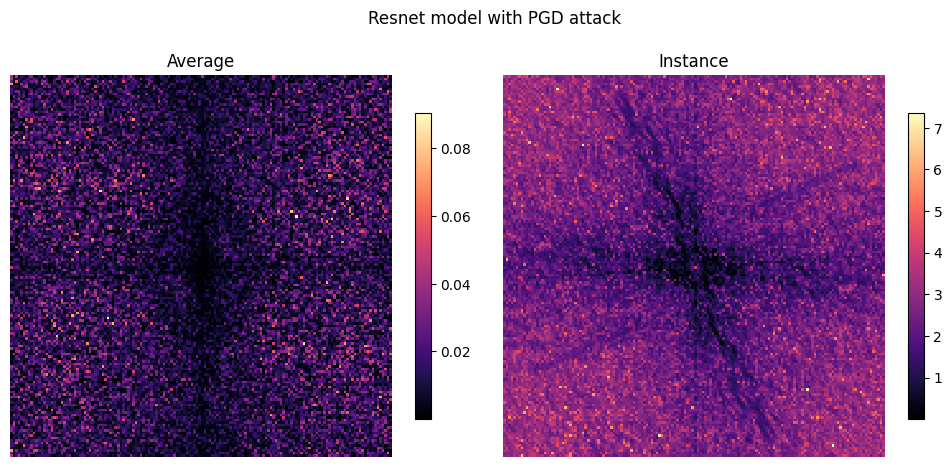

[05/04/24 19:44:40] INFO     Loading data from Regnet_x_model_Adversarial_DeepFool@Dataset      ]8;id=893520;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=36992;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

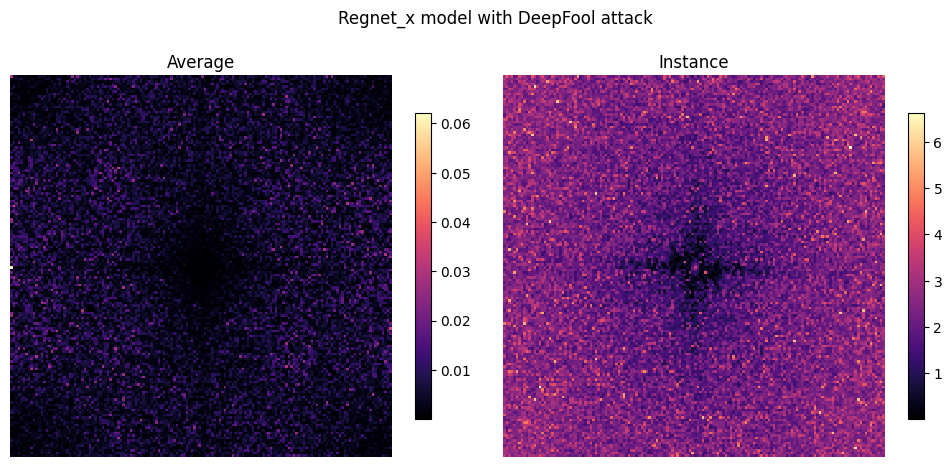

[05/04/24 19:44:50] INFO     Loading data from Regnet_x_model_Adversarial_CarliniL2@Dataset     ]8;id=189947;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=335107;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

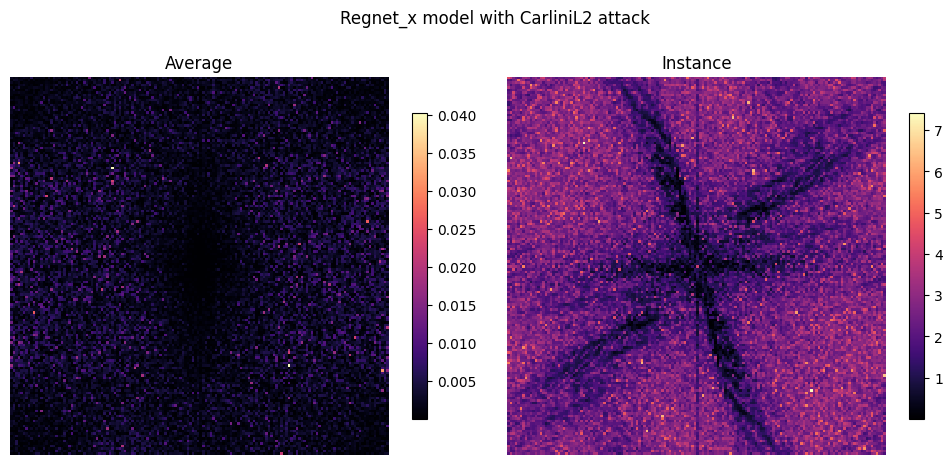

[05/04/24 19:44:59] INFO     Loading data from Regnet_x_model_Adversarial_FSGM@Dataset          ]8;id=891532;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=792117;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

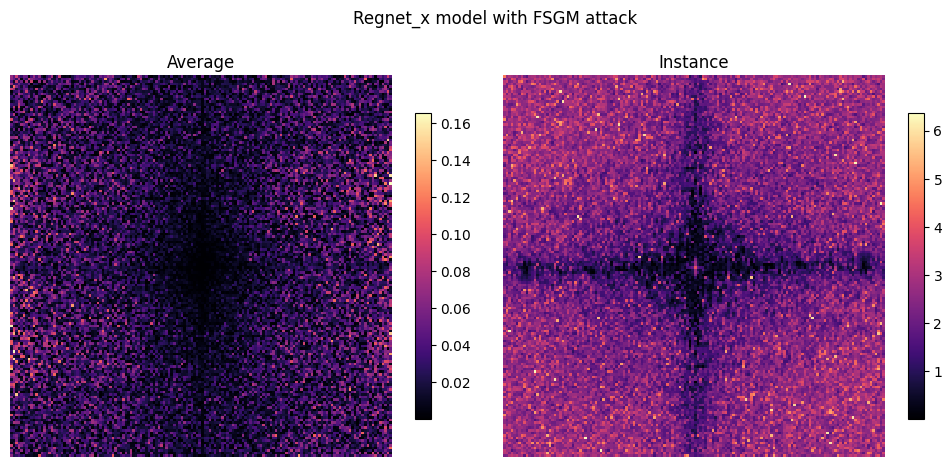

[05/04/24 19:45:10] INFO     Loading data from Regnet_x_model_Adversarial_PGD@Dataset           ]8;id=496076;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=617028;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

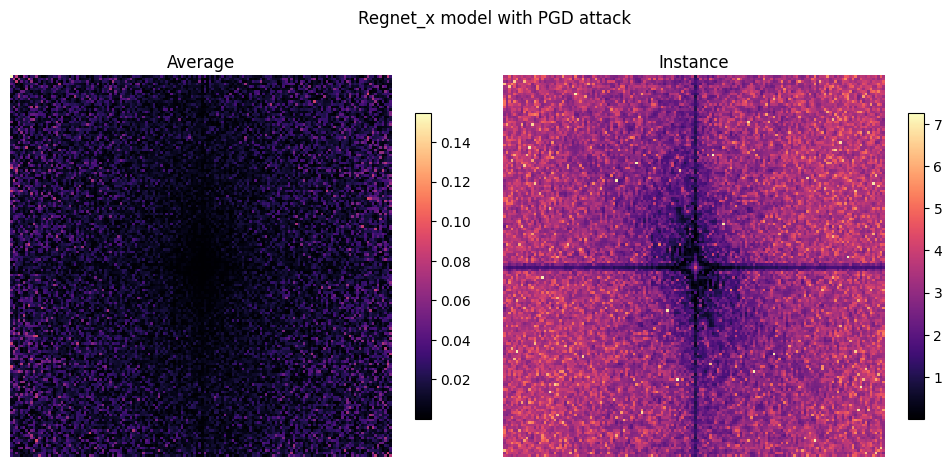

[05/04/24 19:45:20] INFO     Loading data from Regnet_y_model_Adversarial_DeepFool@Dataset      ]8;id=940636;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=948722;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

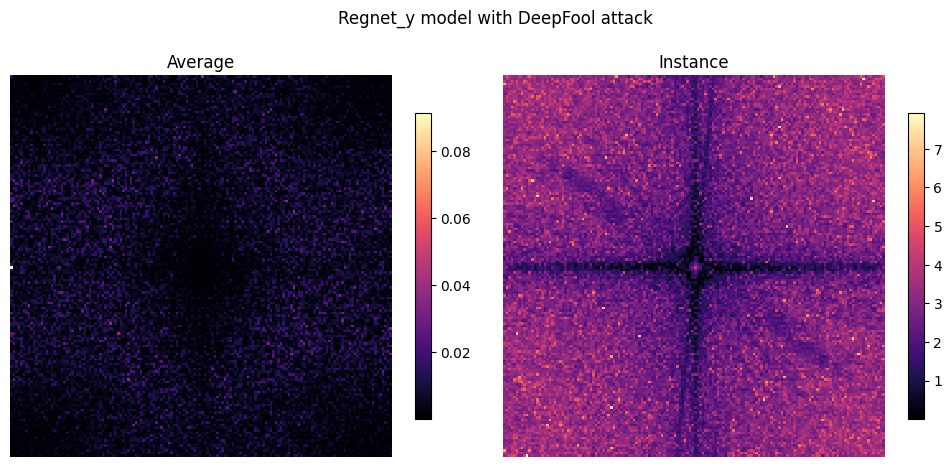

[05/04/24 19:45:29] INFO     Loading data from Regnet_y_model_Adversarial_CarliniL2@Dataset     ]8;id=864328;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=535660;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

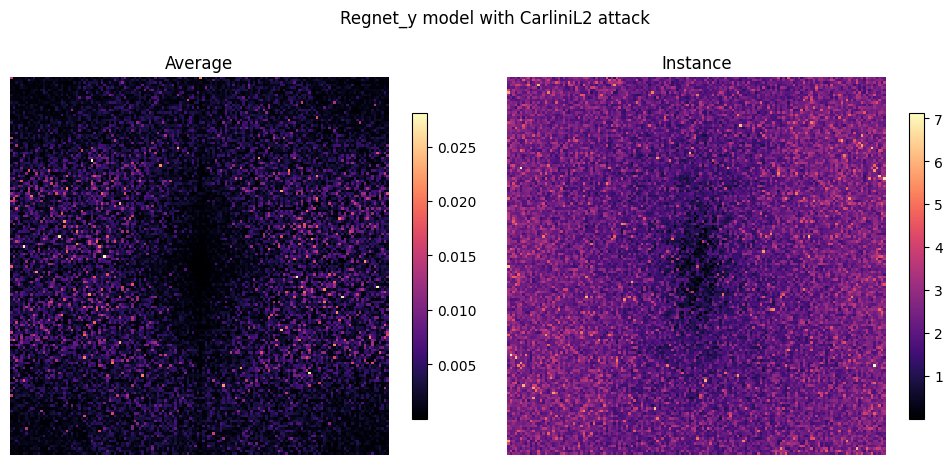

[05/04/24 19:45:39] INFO     Loading data from Regnet_y_model_Adversarial_FSGM@Dataset          ]8;id=243715;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=701481;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

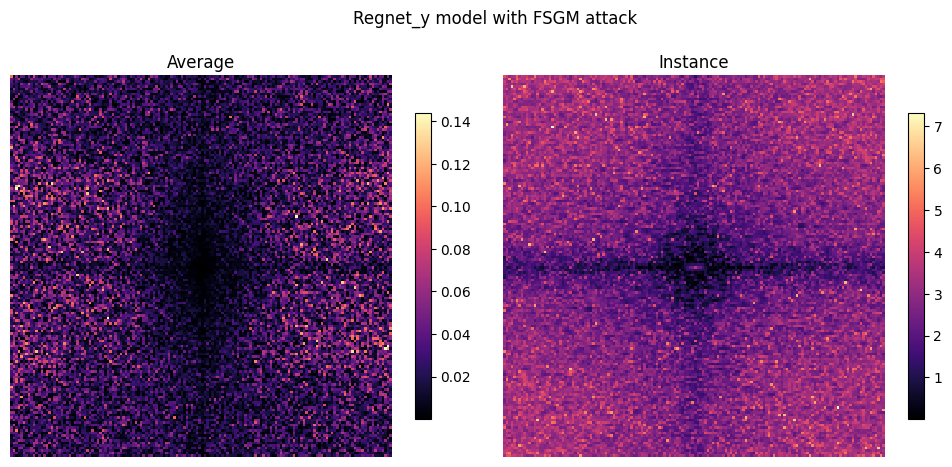

[05/04/24 19:45:48] INFO     Loading data from Regnet_y_model_Adversarial_PGD@Dataset           ]8;id=448308;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=958058;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

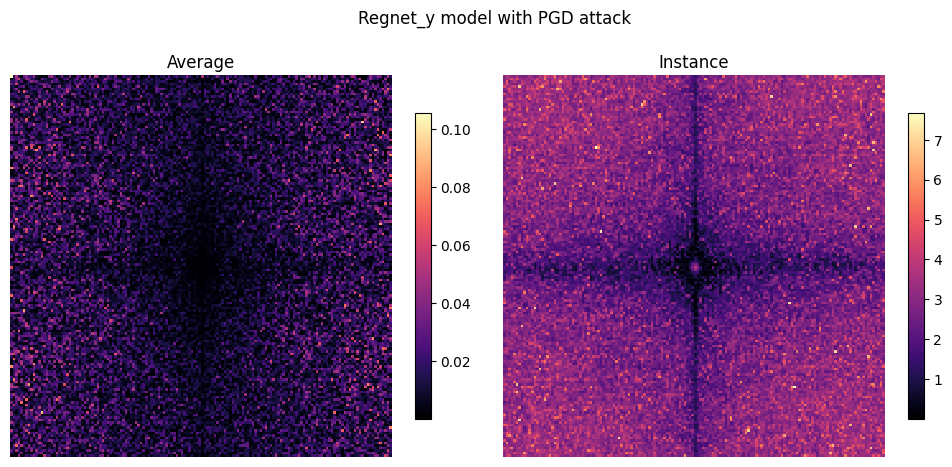

In [61]:

attacks = ["DeepFool", "CarliniL2", "FSGM", "PGD"]
# attacks = ["PGD"]
models = ['Resnet','Regnet_x','Regnet_y']
# models = ['Resnet',]
classes  = catalog.load('params:Report_params.Classes_names')
image_size = catalog.load("params:Data_information.input_shape")
for model, attack in it.product(models, attacks):
    adver = catalog.load(f'{model}_model_Adversarial_{attack}@Dataset')
    #get adversarial and original images
    original_images = adver['original']
    adversarial_images = adver['examples']
    average_difference = torch.zeros(*image_size)
    #iterate through the images and compute the FFT
    for i in range(len(original_images)):
        original_image = original_images[i]
        adversarial_image = adversarial_images[i]
        original_fft = randomFFT(original_image)
        adversarial_fft = randomFFT(adversarial_image)
        difference = adversarial_fft - original_fft
        average_difference += difference
    average_difference /= len(original_images)
    
    plot_FFT(average_difference,adversarial_fft,title=f"{model} model with {attack} attack")


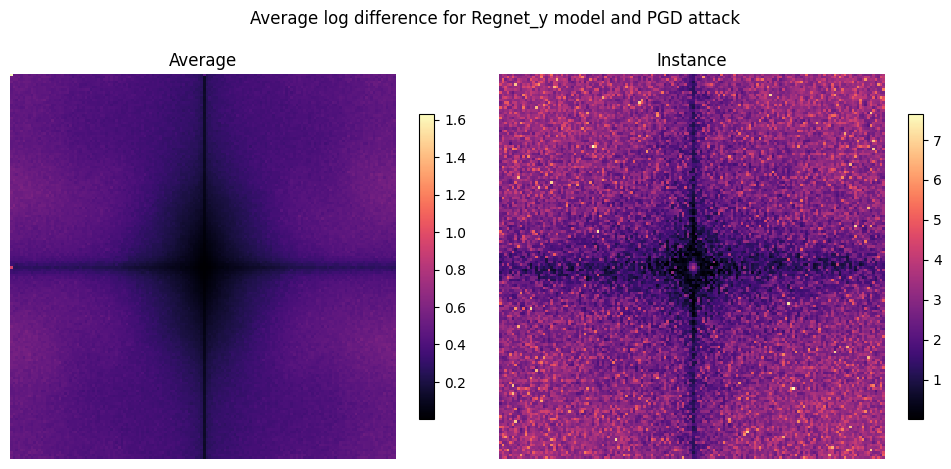

In [56]:
# Plot the result
def plot_FFT(avg_diff,instance,size=(10,5),cmap = 'magma', title = ''):
    fig, ax = plt.subplots(1, 2, figsize=size)
    # Plot the average difference
    cbar1 = ax[0].imshow(20*avg_diff, cmap=cmap, interpolation='nearest')
    fig.colorbar(cbar1, ax=ax[0],shrink=0.7)
    ax[0].axis('off')
    ax[0].set_title(f"Average")

    # Plot the last adversarial_fft
    cbar2 = ax[1].imshow(torch.abs(instance), cmap=cmap, interpolation='nearest')
    fig.colorbar(cbar2, ax=ax[1],shrink=0.7)
    ax[1].axis('off')
    ax[1].set_title(f"Instance")

    fig.suptitle(title)
    # plt.subplots_adjust(hspace=0.9)  # Adjust the spacing between subplots
    fig.tight_layout()
    plt.show()
plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack",cmap='magma')

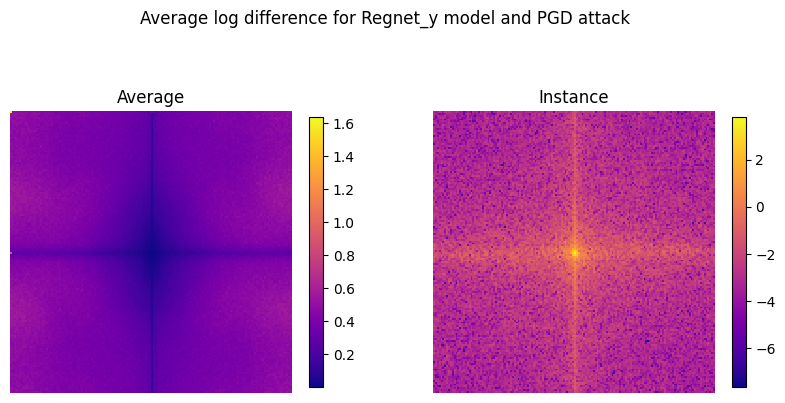

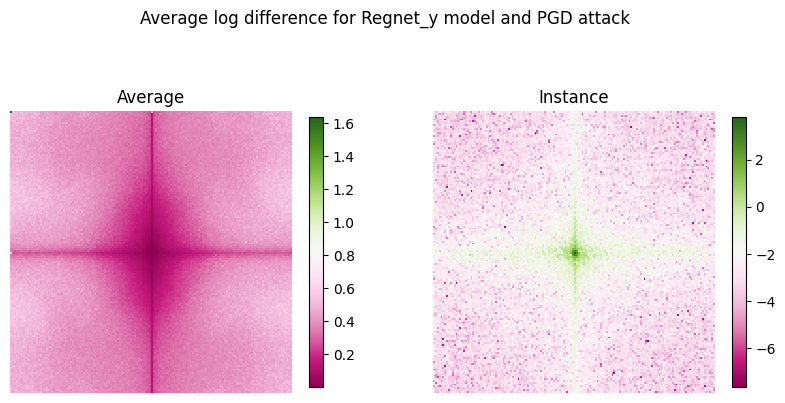

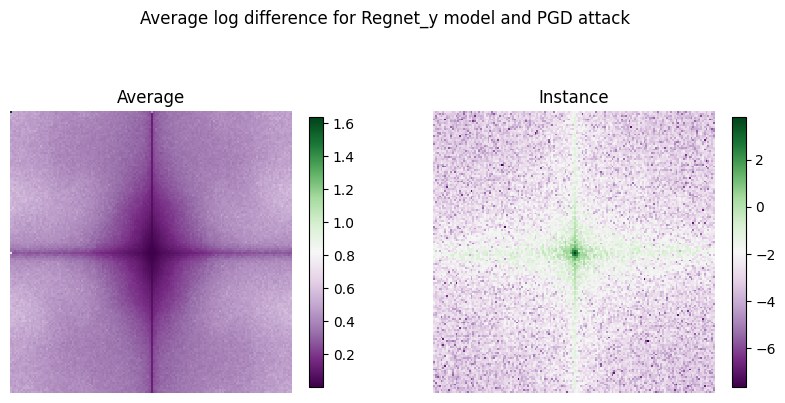

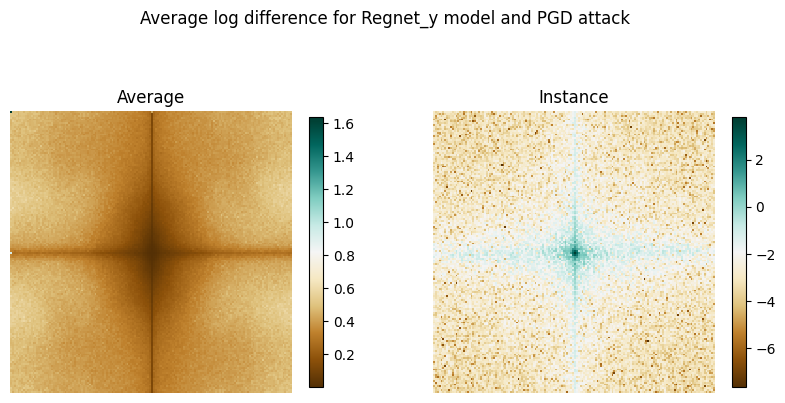

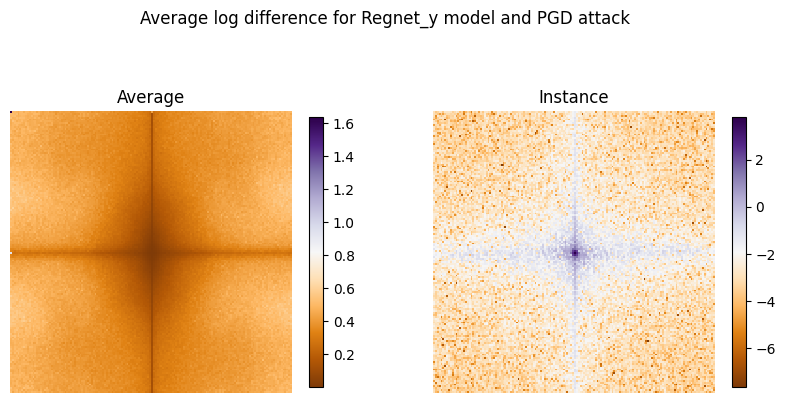

...

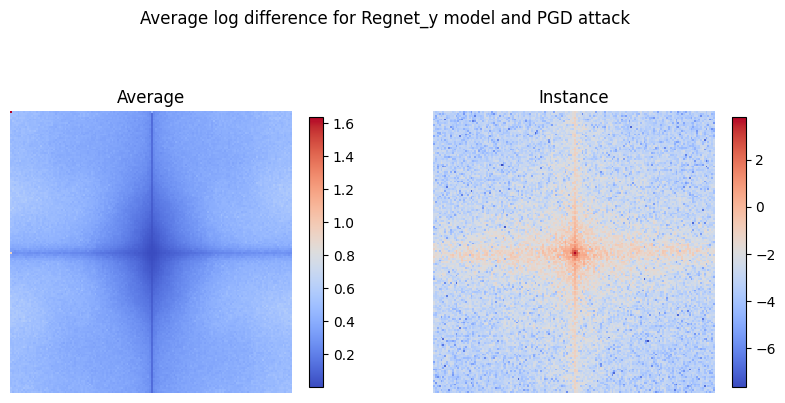

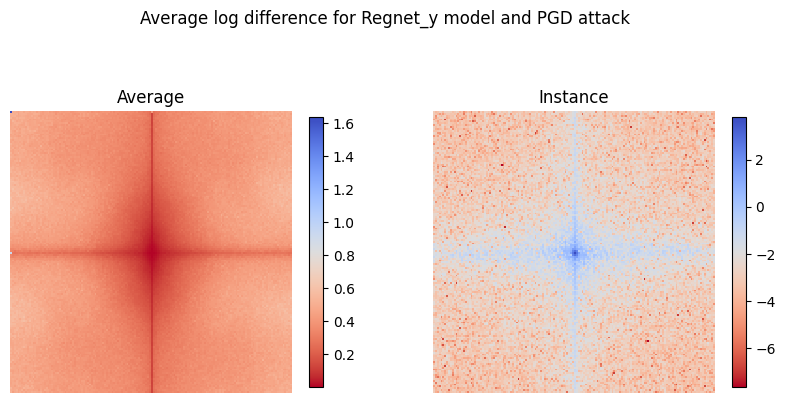

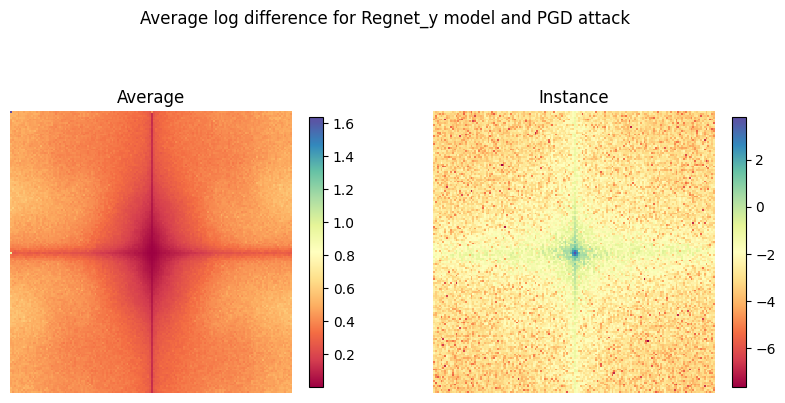

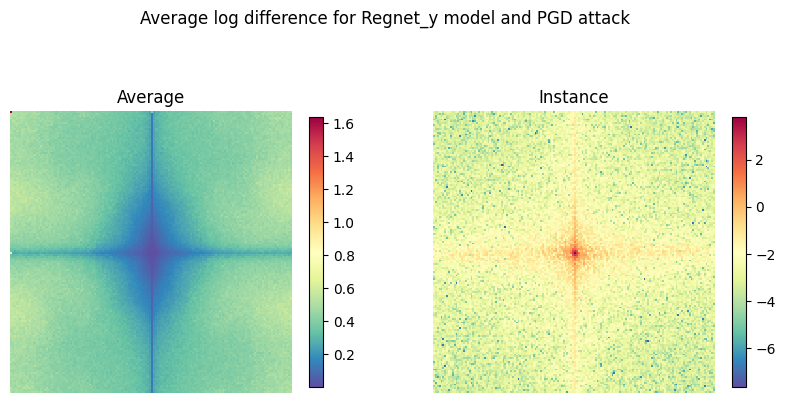

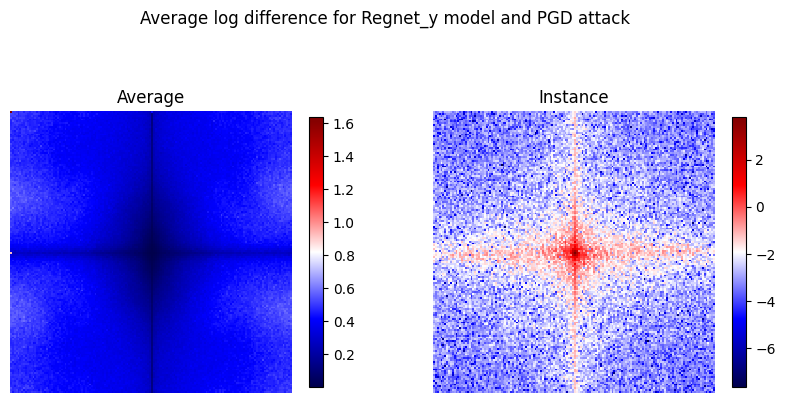

In [ ]:

# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='plasma')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='PiYG')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='PRGn')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='BrBG')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='PuOr')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='RdGy')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='RdBu')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='RdYlBu')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='RdYlGn')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='inferno')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='magma')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='coolwarm')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='coolwarm_r')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='Spectral')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='Spectral_r')
# plot_FFT(average_difference,adversarial_fft,title = f"Average log difference for {model} model and {attack} attack", cmap='seismic')

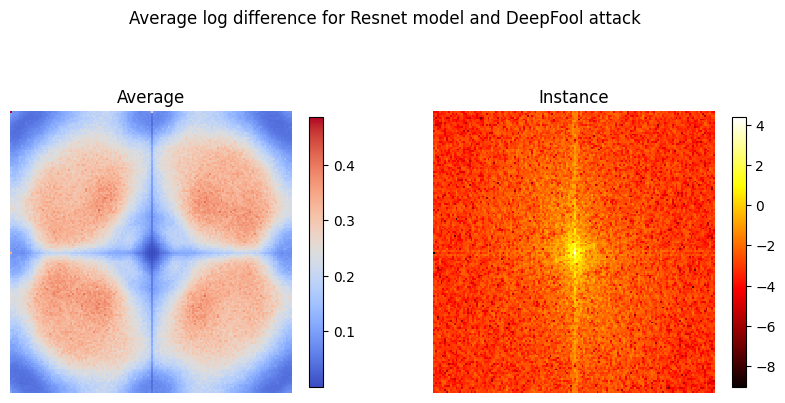

In [40]:

# Plot the result
def plot_FFT(avg_diff,instance,size=(10,5),cmap = 'hot', title = ''):
    fig, ax = plt.subplots(1, 2, figsize=size)
    # Plot the average difference
    cbar1 = ax[0].imshow(20*avg_diff, cmap=cmap, interpolation='nearest')
    fig.colorbar(cbar1, ax=ax[0],shrink=0.7)
    ax[0].axis('off')
    ax[0].set_title(f"Average")

    # Plot the last adversarial_fft
    cbar2 = ax[1].imshow(instance, cmap=cmap, interpolation='nearest')
    fig.colorbar(cbar2, ax=ax[1],shrink=0.7)
    ax[1].axis('off')
    ax[1].set_title(f"Instance")

    fig.suptitle(title)
    plt.show()
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Plot the average difference
cbar1 = ax[0].imshow(20*average_difference, cmap='coolwarm', interpolation='nearest')
fig.colorbar(cbar1, ax=ax[0],shrink=0.7)
ax[0].axis('off')
ax[0].set_title(f"Average")

# Plot the last adversarial_fft
cbar2 = ax[1].imshow(adversarial_fft, cmap='hot', interpolation='nearest')
fig.colorbar(cbar2, ax=ax[1],shrink=0.7)
ax[1].axis('off')
ax[1].set_title(f"Instance")

fig.suptitle(f"Average log difference for {model} model and {attack} attack")
plt.show()

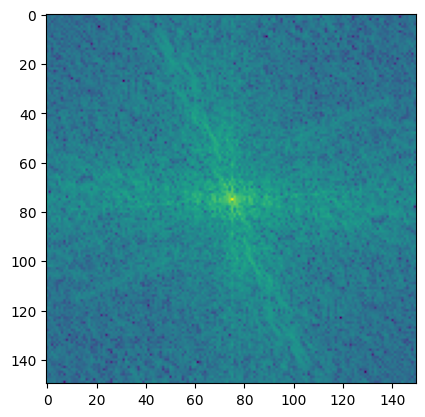

In [19]:
plt.imshow(adversarial_fft)

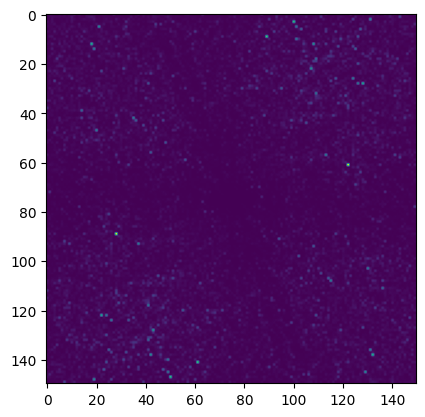

In [23]:
plt.imshow(torch.abs(original_fft- adversarial_fft))

# Instance and methodology

In [7]:
%reload_kedro --env intel

[05/05/24 21:20:47] INFO     Resolved project path as:                                              ]8;id=796888;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=78416;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#146\146]8;;\
                             /home/jamontanac/Documents/AdversarialExamples/adversarialexamples.                   
                             To set a different path, run '%reload_kedro <project_root>'                           

[05/05/24 21:20:48] INFO     Kedro project AdversarialExamples                                      ]8;id=615185;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=525774;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#115\115]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=722778;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=834452;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#116\116]8;;\
                             'pipelines'                                                                           

                    INFO     Registered line magic 'run_viz'                                        ]8;id=139181;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=443451;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/ipython/__init__.py#122\122]8;;\

[05/05/24 21:36:18] INFO     Loading data from params:Data_information.input_shape              ]8;id=905390;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=604825;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (MemoryDataset)...                                                                    

                    INFO     Loading data from Resnet_model_Adversarial_DeepFool@Dataset        ]8;id=243287;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=766292;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/kedro/io/data_catalog.py#482\482]8;;\
                             (PytorchDatasetDict)...                                                               

Computing FFT for Resnet model with DeepFool attack


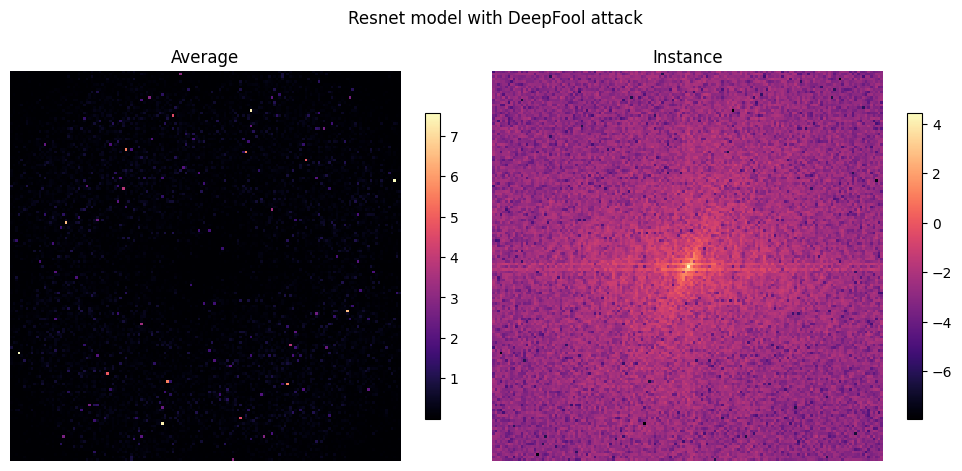

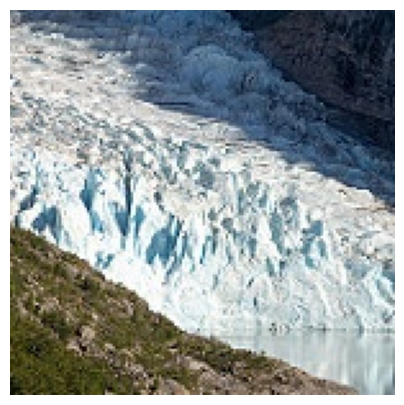

[05/05/24 21:36:19] WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=472031;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=209940;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

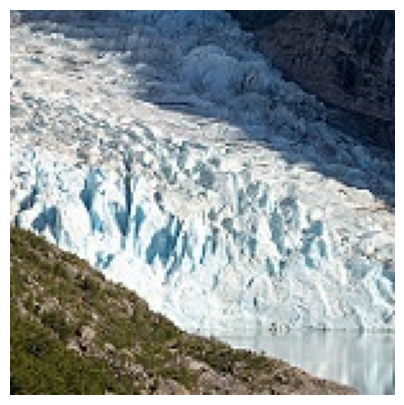

                    WARNING  Clipping input data to the valid range for imshow with RGB data ([0..1]   ]8;id=1875;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py\image.py]8;;\:]8;id=472300;file:///home/jamontanac/miniconda3/envs/AdvExamples/lib/python3.10/site-packages/matplotlib/image.py#701\701]8;;\
                             for floats or [0..255] for integers).                                                 

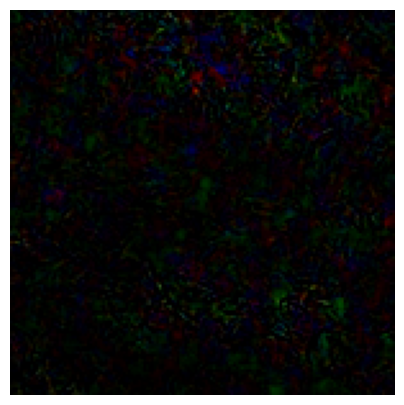

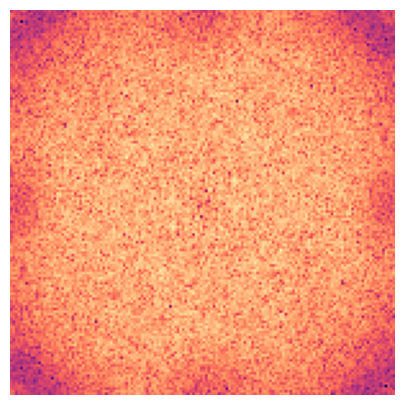

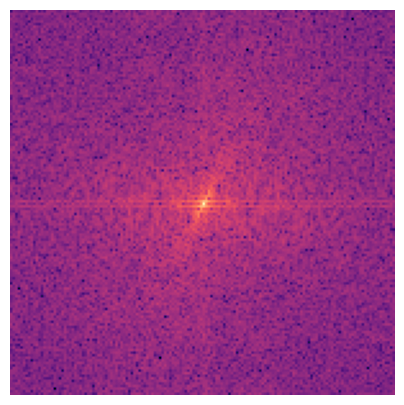

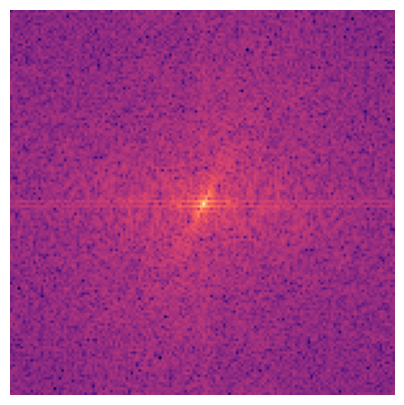

In [18]:
import torch
import itertools as it
import numpy as np
import matplotlib.pyplot as plt

#implement a 2d FFT for an image using pytorch
def randomFFT(image,log=True):
    """
    Apply 2D FFT to a given image.
    img: a tensor of shape (C, H, W)
    """
    # Convert the image to grayscale
    gray_image = torch.mean(image, dim=0, keepdim=True)
    
    # Apply 2D FFT to the grayscale image
    fft = torch.fft.fft2(gray_image, norm="ortho")
    fft = torch.fft.fftshift(fft)
    fft = torch.norm(fft,dim=0) 
    if log:
        fft = torch.log(fft+1e-9)
    
    return fft

def plot_FFT(avg_diff,instance,size=(10,5),cmap = 'magma', title = '',magnitude = True):
    fig, ax = plt.subplots(1, 2, figsize=size)
    # Plot the average difference
    if magnitude:
        instance = torch.abs(instance)
    cbar1 = ax[0].imshow(20*avg_diff, cmap=cmap, interpolation='nearest')
    fig.colorbar(cbar1, ax=ax[0],shrink=0.7)
    ax[0].axis('off')
    ax[0].set_title(f"Average")

    # Plot the last adversarial_fft
    cbar2 = ax[1].imshow(instance, cmap=cmap, interpolation='nearest')
    # cbar2 = ax[1].imshow(instance, cmap=cmap, interpolation='nearest')
    fig.colorbar(cbar2, ax=ax[1],shrink=0.7)
    ax[1].axis('off')
    ax[1].set_title(f"Instance")

    fig.suptitle(title)
    fig.tight_layout()
    plt.show()

def compute_eigen_values(image,fft_image,normalize = False):
    """
    Compute the eigen values of the image and its attack.
    """
    # Convert the image to grayscale
    gray_image = torch.mean(image, dim=0, keepdim=True).squeeze()
    dimensions = gray_image.shape
    gray_image = gray_image@gray_image.T
    fft_image = fft_image@fft_image.T
    eigen_values_image  = torch.linalg.eigvals(gray_image)
    eigen_values_fft  = torch.linalg.eigvals(fft_image)
    if normalize:
        eigen_values_image = eigen_values_image/dimensions[0]
        eigen_values_fft = eigen_values_fft/dimensions[0]

    return eigen_values_image, eigen_values_fft
    # return eigen_values_image, eigen_values_adv
def plot_eigen_values(eigen_values, title = ''):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    # Plot eigen values of noise
    axs[0].hist(eigen_values['eigen_values_noise'], bins=100, density=True)
    axs[0].set_yscale('log')
    axs[0].set_title('Eigen Values')

    # Plot eigen values of the fft of the noise
    axs[1].hist(eigen_values['eigen_values_noise_fft'], bins=100, density=True)
    axs[1].set_yscale('log')
    axs[1].set_title('FFT eigenvalues')

    plt.show()



attacks = ["DeepFool", "CarliniL2", "FSGM", "PGD"]
models = ['Resnet','Regnet_x','Regnet_y']
image_size = catalog.load("params:Data_information.input_shape")

for model, attack in it.product(models, attacks):
    adver = catalog.load(f'{model}_model_Adversarial_{attack}@Dataset')
    #get adversarial and original images
    original_images = adver['original']
    adversarial_images = adver['examples']
    average_difference = torch.zeros(*image_size)
    eigen_values_noise = torch.zeros(image_size[0]*len(original_images))
    eigen_values_noise_fft = torch.zeros(image_size[0]*len(original_images))
    num_images = 0
    #iterate through the images and compute the FFT
    for i in range(len(original_images)):
        original_image = original_images[i]
        adversarial_image = adversarial_images[i]
        noise_fft = randomFFT(adversarial_image-original_image)
        original_fft = randomFFT(original_image)
        adversarial_fft = randomFFT(adversarial_image)
        difference = torch.abs(adversarial_fft - original_fft)
        eig_image_noise, eig_fft_image_noise = compute_eigen_values(torch.log1p(torch.abs(adversarial_image-original_image)),noise_fft)
        eigen_values_noise[i*image_size[0]:(i+1)*image_size[0]] = torch.real(eig_image_noise)
        eigen_values_noise_fft[i*image_size[0]:(i+1)*image_size[0]] = torch.real(eig_fft_image_noise)
        average_difference += difference
        num_images += 1
        break
    print(f"Computing FFT for {model} model with {attack} attack")
    # average_difference /= len(original_images)
    average_difference /= num_images
    eigen_info = {
        'eigen_values_noise': eigen_values_noise,
        'eigen_values_noise_fft': eigen_values_noise_fft,
    }

    plot_FFT(average_difference,adversarial_fft,title=f"{model} model with {attack} attack",magnitude = False)
    #plot clean image
    plt.figure(figsize=(5,5))
    plt.imshow(original_image.numpy().transpose((1,2,0)))
    plt.axis('off')
    plt.show()
    #plot adversarial image
    plt.figure(figsize=(5,5))
    plt.imshow(adversarial_image.numpy().transpose((1,2,0)))
    plt.axis('off')
    plt.show()
    #plot noise
    plt.figure(figsize=(5,5))
    plt.imshow(50*(adversarial_image-original_image).numpy().transpose((1,2,0)))
    plt.axis('off')
    plt.show()
    #plot FFT of noise
    plt.figure(figsize=(5,5))
    plt.imshow(noise_fft,cmap='magma')
    plt.axis('off')
    plt.show()
    #plot original image FFT
    plt.figure(figsize=(5,5))
    plt.imshow(original_fft,cmap='magma')
    plt.axis('off')
    plt.show()
    #plot adversarial image FFT
    plt.figure(figsize=(5,5))
    plt.imshow(adversarial_fft,cmap='magma')
    plt.axis('off')
    plt.show()
    break

torch.Size([3, 32, 32])